# Bjerknes Compensation in iHESP PI-CTRL 
Model and experiment description: https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2020MS002298

Note that the first 150 years of PI-CTRL exhibit an adjustment of the upper ocean due to hardware issues during the model run. 

In [1]:
import netCDF4 as nc
from netCDF4 import Dataset

import numpy as np

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

import xarray as xr

from scipy import signal
from scipy import stats

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from sklearn import linear_model
import statsmodels.api as sm


# Methods and constants

`getData(var, directory, t, lats, lons, z, getDataset, ocn)`: 
- "all" retrieves years 170-519. The first 150 years are excluded because of model drift

In [2]:
# directory paths
atmdir = "/global/project/projectdirs/m1199/iHESP/Atmosphere/"
ocndir = "/global/project/projectdirs/m1199/iHESP/Ocean/"
ocndirsc = "/global/cscratch1/sd/wilbert/iHESP/Ocean/"

# constants
a = 6.3781e6 
area = np.load("data/area.npy") # solid angle (multiply by a^2 to get area)

# colors for AHT terms
colors = {"Total": 'tomato',
         "SW TOA": 'gold',
         "SW sfc": 'orange', 
         "LW TOA": 'lightskyblue', 
         "LW sfc": 'cornflowerblue',
         "SW+LW clear-sky": 'silver', 
         "SW+LW cloud": 'dimgrey',
         "LW cloud": "seagreen",
         "LW clear-sky": "slateblue",
         "SW cloud": "chocolate",
         "SW clear-sky": "goldenrod",
         "Latent": 'plum',
         "Sensible": 'violet',
         "SW": 'darkorange',
         "LW": 'deepskyblue',
         "Turbulent": 'mediumorchid',
         "TOA": "slateblue",
         "OHT": "crimson",
         "OHC": "palevioletred"}

# in:    t (1 to 50, decade for atmosphere; 21 to 519, year for ocean)
#        ocn (logical)
# out:   string corresponding to date range 
def getTimeRange(t, ocn):
    if ocn:
        # takes in t as a year
        initial = (t) * 100 + 1 
        final = (t) * 100 + 12
        return "00" + str(initial) + "-00" + str(final) if initial < 10000 else "0" + str(initial) + "-0" + str(final)
    else: 
        initial = (t + 1) * 1000 + 1 if t != 1 else (t + 1) * 1000 + 101
        final = (t + 1) * 1000 + 912
        return "00" + str(initial) + "-00" + str(final) if initial < 10000 else "0" + str(initial) + "-0" + str(final)

def getFileName(var, t, ocn):
    if ocn:
        return "B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h."+var+"."+getTimeRange(t,ocn)+".nc"
    else:
        return "B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.cam.h0."+var+"."+getTimeRange(t,ocn)+".gr.nc"
    
# in:    var (str)
#        directory (atmdir or ocndir)
#        t (1 to 50) corresponding to decade
#        getDataset 
#        domain 
# out:   data

# todo: add option to revert back to full spatial dataset

def getData(var, directory, t, lats=[0,257], lons=[0,512], z=[0,0], getDataset=False, ocn=False):
    if t == "all":
        if ocn:
            # initial data on which to append
            filename = getFileName(var, 170, ocn)
            data = xr.open_dataset(directory+var+"/"+filename).variables[var][:,z[0]:z[1],lats[0]:lats[1],lons[0]:lons[1]]
            for i in range(171,520,1):
                filename = getFileName(var, i, ocn)
                data = np.append(data, xr.open_dataset(directory+var+"/"+filename).variables[var][:, z[0]:z[1], lats[0]:lats[1], lons[0]:lons[1]], axis=0)
            return data
        else:
            # initial data on which to append
            filename = getFileName(var, 16, ocn)
            data = xr.open_dataset(directory+var+"/"+filename).variables[var][:,lats[0]:lats[1],lons[0]:lons[1]]
            
            for i in range(34):
                filename = getFileName(var, i+17, ocn)
                # append to time axis
                if z == [0,0]:
                    data = np.append(data, xr.open_dataset(directory+var+"/"+filename).
                                     variables[var][:, lats[0]:lats[1], lons[0]:lons[1]], axis=0)
                else:
                    data = np.append(data, xr.open_dataset(directory+var+"/"+filename).
                                     variables[var][:, z[0]:z[1], lats[0]:lats[1], lons[0]:lons[1]], axis=0)
        return data 
    else: 
        filename = getFileName(var, t, ocn)
        data = xr.open_dataset(directory+var+"/"+filename)
        
        if ocn:
            return data if getDataset else data.variables[var][:,z[0]:z[1],lats[0]:lats[1],lons[0]:lons[1]]
        else: 
            return data if getDataset else data.variables[var][:,lats[0]:lats[1],lons[0]:lons[1]]

# Description: gets data from ocean directory
# 
# In: fileVar (str) name of file variable 
#     var     (str) name of variable within file
#     t       (arr) initial and end year indices (exclusive)
#     z       (arr) depth indices 
#     lat     (arr) latitude indices
#     lon     (arr) longitude indices
# 
# Out: data (np array)

def getOcnData(fileVar, var, t, z, lat, lon):
    data = []
    for i in range(t[0],t[1],1):
        data.append(nc.Dataset(ocndirsc+fileVar+"/"+getFileName(fileVar, i, True)).variables[var][:,z[0]:z[1],lat[0]:lat[1],lon[0]:lon[1]])
    return data

# takes running mean for first axis 
def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0, axis=0), axis=0) 
    return (cumsum[N:] - cumsum[:-N]) / float(N)

# Description: regresses a spatial timeseries onto a linear timeseries (useful for OHT regression)
# 
# In: x (spatial timeseries that depends on y)
#     y (linear timeseries, e.g. OHT) 
# 
# Out: coef (array of dimensions [nlat, nlon, 2])
#      coef[:,:,0] is the spatial regression coefficients 
#      coef[:,:,1] is the p value

def regress_spatial(x, y): 
    nt, nlat, nlon = x.shape

    # regress using statsmodel (also gets p value for regression slope)
    reg = np.zeros((nlat, nlon, 2))

    for i in range(nlat):
        for j in range(nlon):
            if not x[0,i,j] == np.nan:
                fit = sm.OLS(x[:,i,j], y).fit()
                reg[i,j,0] = fit.params[0]
                reg[i,j,1] = fit.pvalues[0] 

    return reg

# Description: takes annual mean of a timeseries
# 
# In: a (spatial timeseries)
# 
# Out: a_ann (annual mean)

def annmean(a):
    dims = a.shape
    return np.mean(a.reshape(((-1, 12) + dims[1:])), axis=1) 

# Description: computes the southward cumulative integral of a flux.
#              useful for calculating AHT components 
#
# In: flx (spatial timeseries)
#
# Out: southward-integrated cumulative flux (timeseries as function of latitude)

def calcAHT(flx):
    nt, nlat, nlon = flx.shape
    area = np.load("data/area.npy")
    a = 6.3781e6     # radius of the earth in m
    
    # find the area integrated net flux for each grid cell
    fint = flx * area[(257-nlat):,:] * a**2

    fxint = fint.sum(axis=2) # integrate zonally 

    aht = np.flip(np.cumsum(np.flip(fxint, axis=1), axis=1), axis=1) # integrate meridionally
    
    return aht

# Description: calculates the compensation rate 
#
# In: AHT (detrended, demeaned, 10-yr moving mean) 
#     OHT (detrended, demeaned, 10-yr moving mean)
#
# Out: compensation rate (%) 

def calcCR(aht, oht):
    tht = aht + oht
    ht = np.abs(np.array([aht, oht]))
    return np.mean(1 - np.abs(tht)/np.max(ht,axis=0)) * 100

# Description: calculates a lagged correlation coefficient
#
# In: x (timeseries)
#     y (timeseries)
#     lag (lead lag time) 
#
# Out: r (array of length lag * 2 + 1)
# 
# Note: y leads x for positive lag

def laggedCorr(x, y, lag):
    if not x.shape == y.shape:
        raise ValueError('input arrays are not the same size')
    
    nt = len(x)
    
    corr = []
    
    for i in range(lag+1):
        corr.insert(0, stats.pearsonr(x[i:], y[0:(nt-i)])[0])
        if not i == 0:
            corr.append(stats.pearsonr(y[i:], x[0:(nt-i)])[0])
    
    return corr

lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"][128:]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]


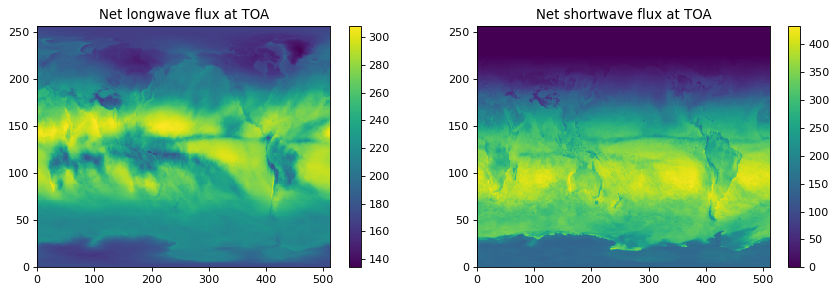

In [3]:
# sign convention: 
# positive longwave is net upwards 
# positive shortwave is net downwards 

flnt = getData("FLNT", atmdir, 10)
fsnt = getData("FSNT", atmdir, 1)

figure(figsize=(13, 4), dpi=80)

plt.subplot(1,2,1)
plt.pcolormesh(flnt[0,:,:])
plt.title('Net longwave flux at TOA')
plt.colorbar()

plt.subplot(1,2,2)
plt.pcolormesh(fsnt[0,:,:])
plt.title('Net shortwave flux at TOA')
plt.colorbar()

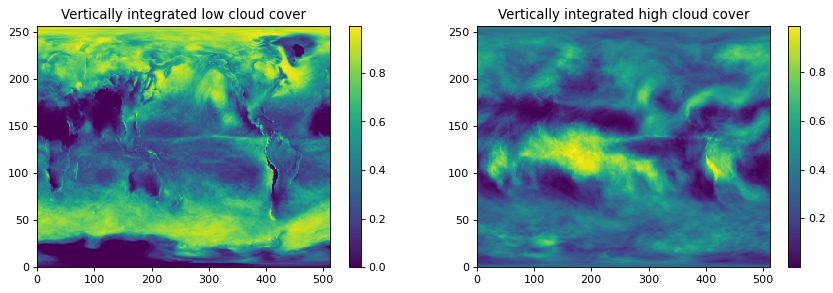

In [4]:
cldlow = getData("CLDLOW", atmdir, 1)
cldhgh = getData("CLDHGH", atmdir, 1)

figure(figsize=(13, 4), dpi=80)

plt.subplot(1,2,1)
plt.pcolormesh(cldlow[0,:,:])
plt.title('Vertically integrated low cloud cover')
plt.colorbar()

plt.subplot(1,2,2)
plt.pcolormesh(cldhgh[0,:,:])
plt.title('Vertically integrated high cloud cover')
plt.colorbar()


# Calculating AHT and BJC
## Latent heat flux snow correction
Here we estimate the total heat flux at the surface and TOA. We add a correction for the latent heat flux due to snowfall as such:

$F_{snow} = \rho_w \Delta H_{fus} (P_{sc} + P_{sl})$

where $P_{sc}$ and $P_{sl}$ are the convective and large-scale snowfall rates respectively (units m/s)

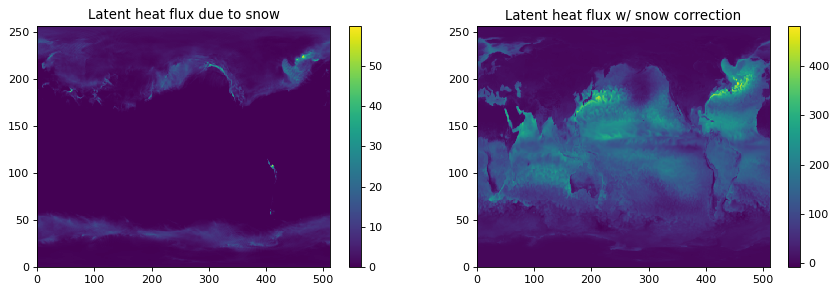

In [127]:
# latent and sensible heat flux
# up is positive (both)
lhfs = getData("LHFLX", atmdir, 1, nhemisphere=False)
shfs = getData("SHFLX", atmdir, 1, nhemisphere=False)

# get snowfall rate 
precsc = getData("PRECSC", atmdir, 1, nhemisphere=False)
precsl = getData("PRECSL", atmdir, 1, nhemisphere=False) 

# calculate the latent heat flux due to snowfall
# rho_w * L_w * (snow rate)
# positive is up
hflxsnow = 1000 * 334000 * (precsl+precsc)

figure(figsize=(13, 4), dpi=80)

plt.subplot(1,2,1)
plt.pcolormesh(hflxsnow[0,:,:])
plt.title('Latent heat flux due to snow')
plt.colorbar()

plt.subplot(1,2,2)
plt.pcolormesh(lhfs[0,:,:] + hflxsnow[0,:,:])
plt.title('Latent heat flux w/ snow correction')
plt.colorbar()

In [3]:
# get entire timeseries of fluxes to calculate AHT timeseries 
flnt = getData("FLNT", atmdir, "all", [128,257])
fsnt = getData("FSNT", atmdir, "all", [128,257])

flns = getData("FLNS", atmdir, "all", [128,257])
fsns = getData("FSNS", atmdir, "all", [128,257])

lhfs = getData("LHFLX", atmdir, "all", [128,257])
shfs = getData("SHFLX", atmdir, "all", [128,257])

# get snowfall rate 
precsc = getData("PRECSC", atmdir, "all", [128,257])
precsl = getData("PRECSL", atmdir, "all", [128,257]) 

# calculate the latent heat flux due to snowfall
# rho_w * L_w * (snow rate)
# positive is up
hflxsnow = 1000 * 334000 * (precsc + precsl)

# total fluxes (up is positive)  
fnt = flnt - fsnt 
fns = flns - fsns + lhfs + shfs + hflxsnow

# get lat lon grid 
lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]
area = getData("FLNT", atmdir, 1, getDataset=True).variables["area"] # solid angle subtended by gridcell

nlat = lat.size
nlon = lon.size

a = 6.3781e6     # radius of the earth in m

In [4]:
# find the area integrated net flux for each grid cell
fint = (fnt - fns) * area[128:,:].to_numpy() * a**2

fxint = fint.sum(axis=2) # integrate zonally 

aht = np.flip(np.cumsum(np.flip(fxint, axis=1), axis=1), axis=1) # integrate meridionally

np.save("data/AHT", aht)

## Decomposing AHT into separate flux components


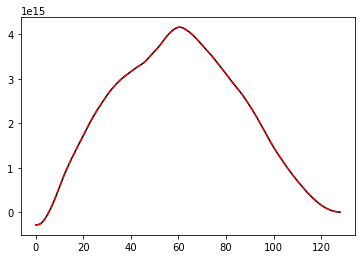

In [5]:
flns = np.load("data/rflx/FLNS_ann.npy") 
flnt = np.load("data/rflx/FLNT_ann.npy")
fsns = np.load("data/rflx/FSNS_ann.npy")
fsnt = np.load("data/rflx/FSNT_ann.npy")
shflx = np.load("data/SHFLX_ann.npy")
lhflx = np.load("data/LHFLX_ann.npy")

orig_aht = np.load("data/AHT_ann.npy")

aht = calcAHT(flnt - flns - fsnt + fsns - shflx - lhflx)

plt.plot(aht[0,:], color='k')
plt.plot(orig_aht[0,:], linestyle='dashed', color='r')

In [3]:
# radiative fluxes
flns = np.load("data/rflx/FLNS_ann.npy") 
flnt = np.load("data/rflx/FLNT_ann.npy")
fsns = np.load("data/rflx/FSNS_ann.npy")
fsnt = np.load("data/rflx/FSNT_ann.npy")

flnsc = np.load("data/rflx/FLNSC_ann.npy")
flntc = np.load("data/rflx/FLNTC_ann.npy")
fsntc = np.load("data/rflx/FSNTC_ann.npy")
fsnsc = np.load("data/rflx/FSNSC_ann.npy")

# sensible and latent heat flux
shflx = np.load("data/SHFLX_ann.npy")
lhflx = np.load("data/LHFLX_ann.npy")

flux_terms = {"Total": flnt - flns - fsnt + fsns - shflx - lhflx, 
             "SW TOA": -fsnt, 
             "SW sfc": fsns, 
             "LW TOA": flnt, 
             "LW sfc": -flns,
             "SW cloud": fsns - fsnt - fsnsc + fsntc,
             "SW clear-sky": fsnsc - fsntc,
             "LW cloud": flnt - flns - flntc + flnsc,
             "LW clear-sky": flntc - flnsc, 
             "SW+LW clear-sky": flntc - flnsc + fsnsc - fsntc, 
             "SW+LW cloud": flnt - flns - fsnt + fsns - flntc + flnsc - fsnsc + fsntc, 
             "Latent": -lhflx, 
             "Sensible": -shflx,
             "SW": fsns - fsnt, 
             "LW": flnt - flns, 
             "Turbulent": -lhflx - shflx}

aht_terms = {}

for term in flux_terms:
    aht_terms[term] = calcAHT(flux_terms[term])

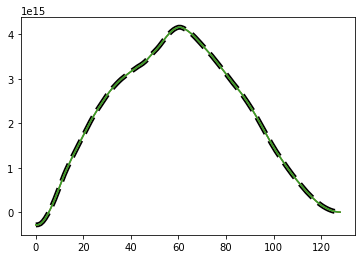

In [7]:
# check that we can still reconstruct from the decomposed terms
plt.plot(aht_terms["Total"][0,:], linewidth=5, color='k', linestyle="dashed")
plt.plot(aht_terms["SW"][0,:] + aht_terms["LW"][0,:] + aht_terms["Turbulent"][0,:])
plt.plot(aht_terms["SW+LW clear-sky"][0,:] + aht_terms["SW+LW cloud"][0,:] + aht_terms["Turbulent"][0,:])
plt.plot(aht_terms["SW TOA"][0,:] + aht_terms["LW TOA"][0,:] +
         aht_terms["SW sfc"][0,:] + aht_terms["LW sfc"][0,:] + 
         aht_terms["Latent"][0,:] + aht_terms["Sensible"][0,:])

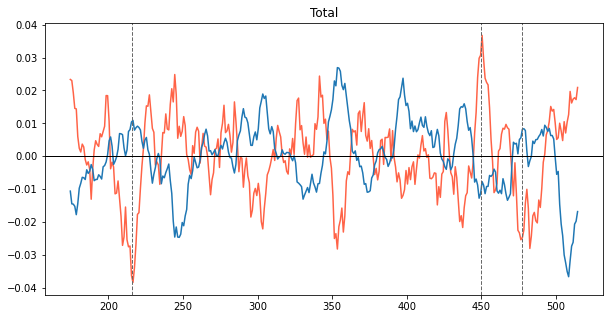

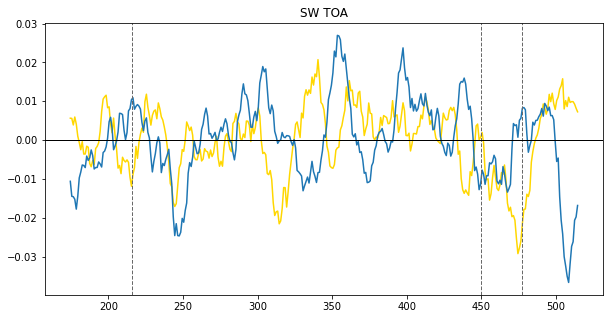

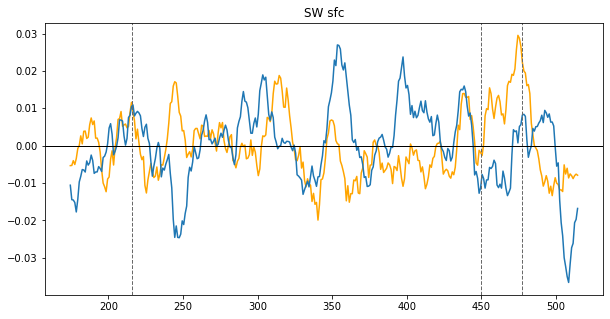

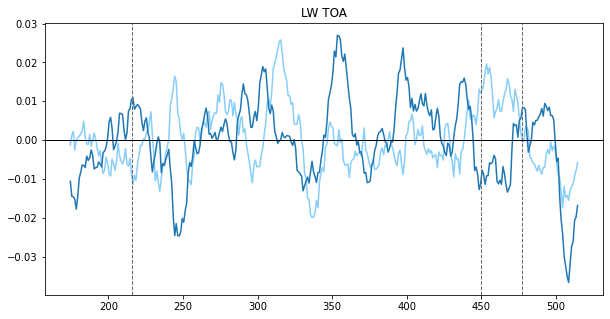

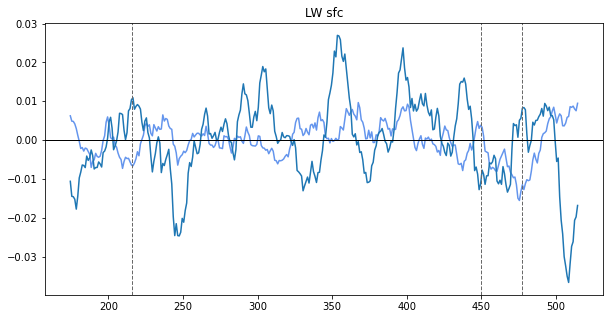

...

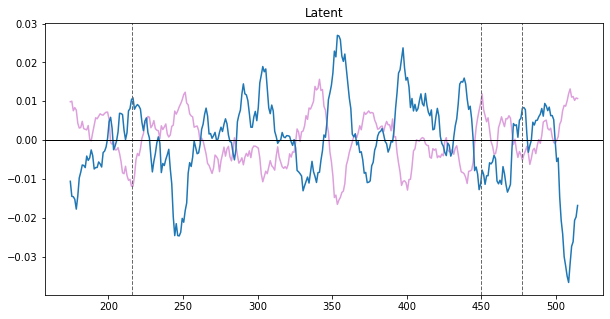

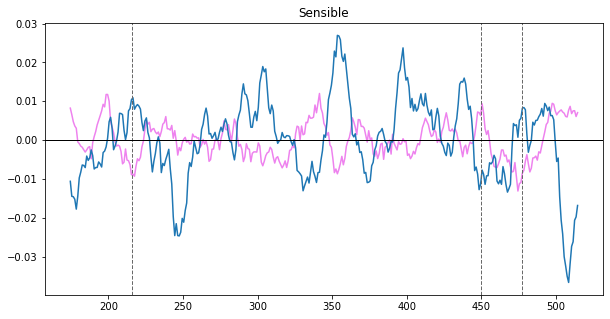

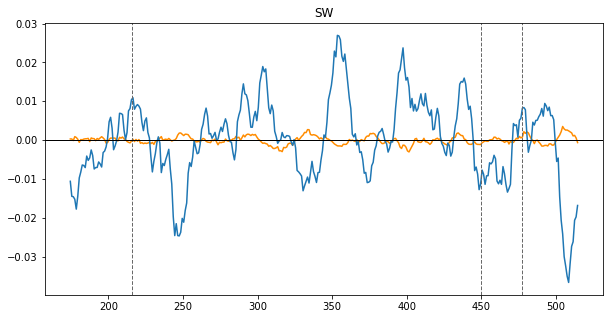

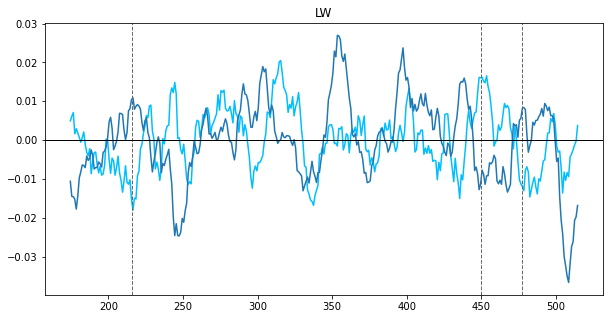

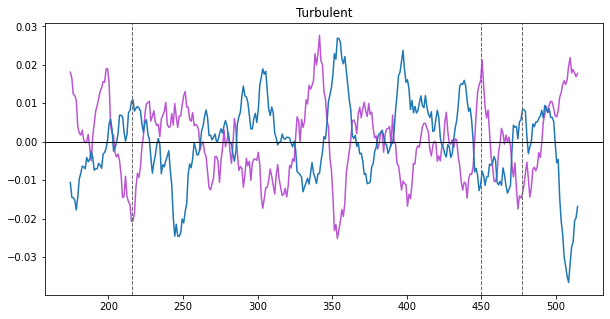

In [4]:
### do regression at 65 N
aht_terms_filt = {}
aht_terms_corr = {}

# get the full (annual mean) OHT timeseries at 65 deg N
oht_ann = xr.open_dataset(ocndir + "vTFlux_65N.nc").variables['vTFlux_65N'][169:]
oht_ann_movmean = running_mean(oht_ann, 10)

# normalize the OHT timeseries
oht_norm = signal.detrend(oht_ann_movmean[:]/oht_ann_movmean[:].std(ddof = 1))

t = np.linspace(174.5,514.5,341)

for i,term in enumerate(aht_terms):
    # take 10yr moving mean, detrend, subtract mean
    term_filtered = signal.detrend(running_mean(aht_terms[term][:,93], 10))
    term_filtered -= np.mean(term_filtered)
    
    aht_terms_filt[term] = term_filtered/1e15 # convert to PW

    plt.figure(figsize=(10,5))
    
    plt.plot(t,term_filtered/1e15, color=colors[term])
    plt.title(term)
    plt.plot(t,signal.detrend(oht_ann_movmean))
    
    plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axhline(color='k', linewidth=1)
    
    weight = np.std(aht_terms_filt[term]) / np.std(aht_terms_filt["Total"])
    aht_terms_corr[term] = stats.pearsonr(term_filtered, oht_norm)[0] * weight 



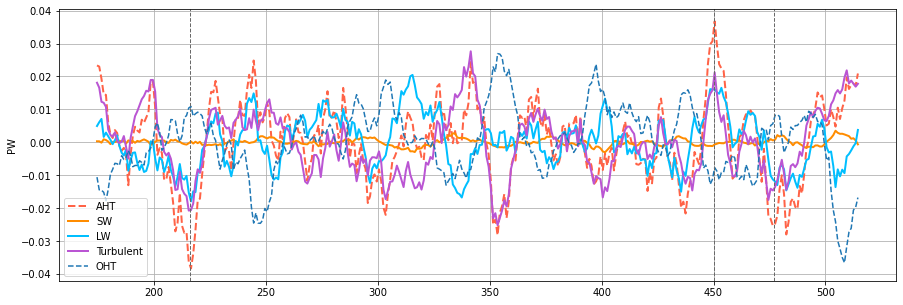

In [9]:
figure(figsize=(15,5))

t = np.linspace(174.5,514.5,341)

plt.plot(t,aht_terms_filt["Total"]/1e15, linewidth=2, linestyle='dashed', color=colors["Total"], label="AHT")
plt.plot(t,aht_terms_filt["SW"]/1e15, linewidth=2, color=colors["SW"], label="SW")
plt.plot(t,aht_terms_filt["LW"]/1e15, linewidth=2, color=colors["LW"], label="LW")
plt.plot(t,aht_terms_filt["Turbulent"]/1e15, linewidth=2, color=colors["Turbulent"], label="Turbulent")
plt.plot(t,signal.detrend(oht_ann_movmean), linestyle='dashed', label="OHT")

plt.grid(True)
plt.legend()

plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')

plt.ylabel("PW")
plt.savefig("figures/AHT_decomp")

**Above:**
- When the AHT response overcompensates OHT, it seems like the LW feedbacks amplify the turbulent heat flux signal
- signal is only in the clear-sky, no signal in cloud timeseries
    - sea ice amplified?
- multidecadal trend in turbulent heat fluxes

AHT corr: -0.6097542098286715
Sum of 3 big terms: -0.609754211753417
Sum of small terms: -0.6097542129271405


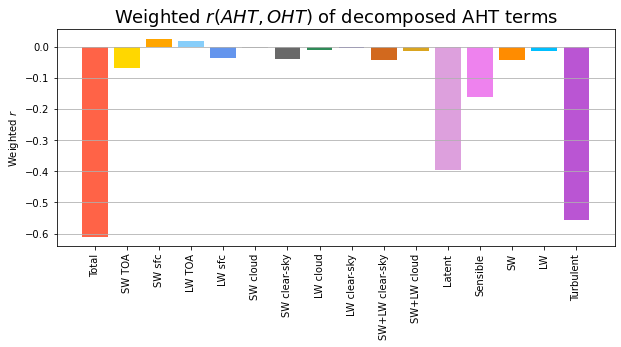

In [10]:
print("AHT corr: " + str(aht_terms_corr["Total"]))
print("Sum of 3 big terms: " + str(aht_terms_corr["SW"] + aht_terms_corr["LW"] + aht_terms_corr["Turbulent"]))
print("Sum of small terms: " + str(aht_terms_corr["SW TOA"] + aht_terms_corr["LW TOA"] + 
                                   aht_terms_corr["SW sfc"] + aht_terms_corr["LW sfc"] + 
                                  aht_terms_corr["Sensible"] + aht_terms_corr["Latent"]))

figure(figsize=(10,4))
plt.xticks(rotation='vertical')
plt.bar(aht_terms_corr.keys(), aht_terms_corr.values(), color=colors.values())
plt.title("Weighted $r(AHT, OHT)$ of decomposed AHT terms", fontsize=18)
plt.grid(True, axis='y')
plt.ylabel("Weighted $r$")

plt.savefig("figures/AHT_corr_decomposition.svg", bbox_inches="tight")

## OHT and AHT

(7/16) Some notes regarding calculated OHT and AHT timeseries: 
- The AHT timeseries in AHT.npy was calculated for only north of 50 deg N
    - there remains a residual because np.cumsum starts from the first value and the zonally integrated flux divergence at the north pole is not zero
    - y = 21 corresponds to 65 deg N
- The OHT timeseries is stored in N_HEAT, which has four fields: time, transport_basin, transport_component, lat 
    - OHT timeseries starts at 0278-01 and ends at 0501-12
    - transport_basin 0: global ocean - marginal seas; 1: Atlantic Ocean + Mediterranean Sea + Labrador Sea + GIN Sea + Arctic Ocean + Hudson Bay + Baltic
    - transport_component 0: Total; 1: Mean; 2: Eddy
    - lat: 347 = 65.06 deg N
   
(7/22) Regridded AHT and OHT
- AHT and OHT are regridded using linear interpolation of the nearest two gridpoints. The regridded variables have dimensions `(time, lat)`. AHT has shape `(350, 91)` while OHT has shape `(224, 91)`. The time index for AHT is years after 170; the time index for OHT is years after 278. The latitude index is simply the integer latitude value.     

### Regrid AHT and OHT onto common grid

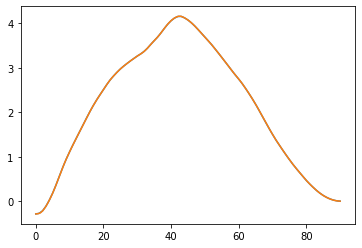

In [30]:
# regrid the OHT via linear interpolation
AHT_mon = np.load("data/AHT.npy")
lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"][128:]
nt, nlat = AHT_mon.shape

AHT_ann = np.mean(AHT_mon.reshape(-1, 12, nlat), axis=1)
AHT_gr = np.zeros((int(nt/12), 91))

AHT_gr[:,0] = AHT_ann[:,0]
AHT_gr[:,90] = AHT_ann[:,128]

for i in range(1,90):
    dist = 0.703125
    i_0 = int(np.floor(i/dist))
    i_1 = int(np.ceil(i/dist))
    
    w_0 = [(lat[i_1] - i)/dist]
    w_1 = [(i - lat[i_0])/dist]
    
    #print(i, float(lat[i_0]), float(lat[i_1]), float(w_0[0]), float(w_1[0]))
    AHT_gr[:,i] = AHT_ann[:,i_0]*w_0 + AHT_ann[:,i_1]*w_1

AHT_gr[:,45] = AHT_ann[:,64]
AHT_gr = AHT_gr/1e15 # convert to PW

# plot it to verify
t1 = np.linspace(0,90,129)
plt.plot(AHT_gr[0,:])
plt.plot(t1,AHT_ann[0,:]/1e15)

#np.save("data/AHT_ann_gr", AHT_gr)

In [31]:
n_heat = xr.open_dataset(ocndir+"N_HEAT/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.N_HEAT.027801.050112.nc").variables['N_HEAT']
oht_lat = xr.open_dataset(ocndir+"N_HEAT/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.N_HEAT.027801.050112.nc").variables['lat_aux_grid']
oht_mon = n_heat[:,:,0,:].to_numpy()

print(oht_mon.shape)

(2688, 2, 395)


(224, 2, 91)

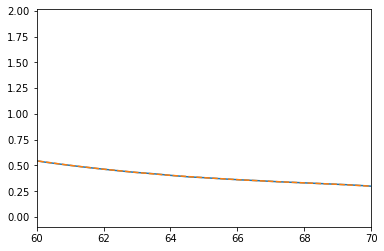

In [32]:
oht_ann = np.mean(oht_mon.reshape(-1, 12, 2, 395), axis=1)
nt, nbasin, nlat = oht_ann.shape

OHT_gr = np.zeros((nt, nbasin, 91))

# regrid the OHT via linear interpolation 
for i in range(0,91):
    dists = np.abs(oht_lat - i)
    mins = np.argpartition(dists, 2)[0:2]
    
    dist = np.abs(oht_lat[mins[0]] - oht_lat[mins[1]])
    
    w_0 = [np.abs(i - oht_lat[mins[1]])/dist]
    w_1 = [np.abs(i - oht_lat[mins[0]])/dist]
    
    # for debugging purposes
    #print(i, float(oht_lat[mins[0]]), float(oht_lat[mins[1]]), float(w_0[0]), float(w_1[0])) 
    OHT_gr[:,:,i] = oht_ann[:,:,mins[0]]*w_0 + oht_ann[:,:,mins[1]]*w_1

# plot it to verify
lat2 = np.linspace(0,90,91)
plt.plot(oht_lat[187:],oht_ann[0,0,187:])
plt.plot(lat2,OHT_gr[0,0,:], linestyle='dashed')
plt.xlim([60,70])
np.save("data/OHT_gr_full", OHT_gr)
OHT_gr.shape



### Check OHT transports through 65 N

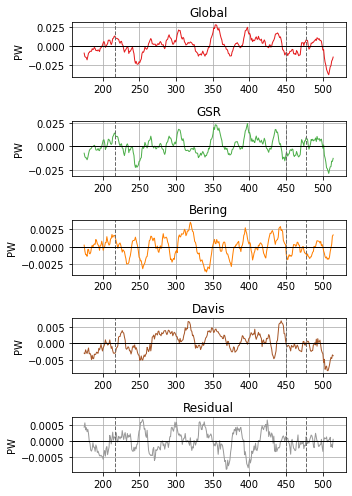

In [5]:
oht_comp = {
    "Global": xr.open_dataset(ocndir + "vTFlux_65N_Global.nc").variables['vTFlux_65N_Global'][169:],
    "GSR": xr.open_dataset(ocndir + "vTFlux_65N_GSR.nc").variables['vTFlux_65N_GSR'][169:],
    "Bering": xr.open_dataset(ocndir + "vTFlux_65N_Bering.nc").variables['vTFlux_65N_Bering'][169:],
    "Davis": xr.open_dataset(ocndir + "vTFlux_65N_Davis.nc").variables['vTFlux_65N_Davis'][169:]
}

oht_comp["Residual"] = oht_comp["Global"]-oht_comp["GSR"]-oht_comp["Bering"]-oht_comp["Davis"]

figure(figsize=(5,7))
t = np.linspace(174.5,514.5,341)

colors = plt.cm.Set1(np.linspace(0,1,5))

for i,term in enumerate(oht_comp.keys()):
    plt.subplot(5,1,i+1)
    plt.plot(t, running_mean(signal.detrend(oht_comp[term]),10), linewidth=1, color=colors[i])
    plt.title(term)
    plt.grid(True)
    #plt.yticks([np.round(oht_comp[term].min(),3), np.round(oht_comp[term].max(),3)])
    plt.ylabel("PW")
    plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axhline(color='k', linewidth=1)
    
plt.tight_layout()
    


In [ ]:
oht_comp_norm = {} 

for term in oht_filt.keys():
    oht_comp_norm[term] = oht_filt[term]/np.std(oht_filt[term])

plt.scatter(oht_comp_norm['Atlantic'], oht_comp_norm['Pacific'], a=0.5)

ValueError: operands could not be broadcast together with shapes (224,) (350,) 

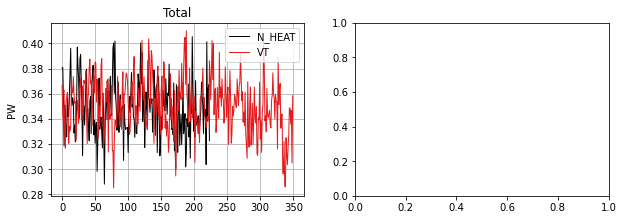

In [4]:
n_heat_oht = np.load("data/OHT_gr_full.npy")

figure(figsize=(10,7))

plt.subplot(2,2,1)
plt.plot(n_heat_oht[:,0,65], color='k', linewidth=1, label='N_HEAT')
plt.plot(oht_comp["Global"], color=colors[0], linewidth=1, label='VT')
plt.grid(True)
plt.title("Total")
plt.ylabel("PW")
plt.legend()

plt.subplot(2,2,2)
plt.plot(n_heat_oht[:,0,65] - oht_comp["Global"])
plt.grid(True)
plt.title("Residual")

plt.subplot(2,2,3)
plt.plot(signal.detrend(n_heat_oht[:,0,65]), color='k', linewidth=1, label='N_HEAT')
plt.plot(signal.detrend(oht_comp["Global"]), color=colors[0], linewidth=1, label='VT')
plt.grid(True)
plt.title("Anomalies")
plt.ylabel("PW")
plt.legend()


plt.subplot(2,2,4)
plt.plot(signal.detrend(n_heat_oht[:,0,65]) - signal.detrend(oht_comp["Global"]))
plt.grid(True)
plt.title("Residual of anomalies")

print("mean residual: " + str(np.mean(np.abs(signal.detrend(n_heat_oht[:,0,65]) - signal.detrend(oht_comp["Global"])))))
print("mean anomaly: " + str(np.mean(np.abs(signal.detrend(n_heat_oht[:,0,65])))))


## Quantifying BJC
A Pearson's $r$ is calculated between 10-yr running mean timeseries of AHT and OHT to quantify the BJC. 

Compensation rate (CR) as defined by Van der Swaluw et al. (2007): $R_C = (1 - \frac{|dH_A+dH_O|}{\max(|dH_A|,\;|dH_O|)})$


### Diagnose BJC at 65N

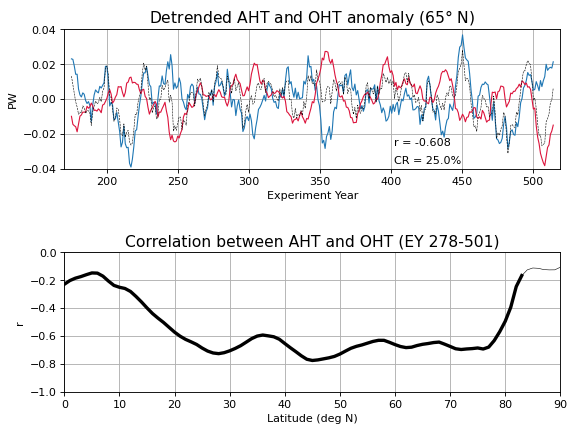

In [160]:
yr_start = 170
yr_end = 519

movmean_interval = 10 #years

# for time axis
years = np.linspace(yr_start+5, yr_end-5, 341)

# get AHT timeseries 
AHT_ann = np.load("data/AHT_ann_gr.npy")
AHT_ann_movmean = running_mean(AHT_ann, 10)

AHT_partial = AHT_ann[108:332,:]
AHT_partial_movmean = running_mean(AHT_partial, 10)

# get the full (annual mean) OHT timeseries at 65 deg N
OHT_ann = xr.open_dataset(ocndir + "vTFlux_65N_Global.nc").variables['vTFlux_65N_Global'][169:]
OHT_ann_movmean = running_mean(OHT_ann, 10)

OHT_partial = np.load("data/OHT_ann_gr.npy")
OHT_partial_movmean = running_mean(OHT_partial, 10)

THT = signal.detrend(AHT_ann_movmean[:,65]) + signal.detrend(OHT_ann_movmean)

# calculate Pearson's r at 65 N (full 350 years)
bjcr_65 = stats.pearsonr(signal.detrend(AHT_ann_movmean[:,65]),signal.detrend(OHT_ann_movmean))
bjcr = np.zeros((91,2))
for i in range(91):
    bjcr[i] = stats.pearsonr(signal.detrend(AHT_partial_movmean[:,i]), signal.detrend(OHT_partial_movmean[:,i]))

# calculate compensation rate 
ht = np.abs(np.array([signal.detrend(OHT_ann_movmean), signal.detrend(AHT_ann_movmean[:,65])]))
cr = np.mean(1 - np.abs(THT)/np.max(ht,axis=0)) * 100

figure(figsize=(8, 6), dpi=80)

plt.subplot(2,1,1)
plt.plot(years, signal.detrend(AHT_ann_movmean[:,65]), label = "AHT", linewidth=1)
plt.plot(years, signal.detrend(OHT_ann_movmean), label = "OHT", color="crimson", linewidth=1)
plt.plot(years, signal.detrend(THT), label = "Tot", color="k", linewidth=0.5, linestyle="dashed")
plt.grid(True)
plt.title("Detrended AHT and OHT anomaly (65$\degree$ N)", fontsize=14)
plt.xlabel("Experiment Year")
plt.xlim([170, 519])
plt.ylim([-0.04,0.04])
plt.ylabel("PW")
plt.text(402,-0.027, 'r = ' + str(np.around(bjcr_65[0],3)))
plt.text(402,-0.037, 'CR = ' + str(np.around(cr,1)) + "%")

plt.subplot(2,1,2)
plt.plot(bjcr[:,0], linewidth=0.5, color='k')
plt.plot(bjcr[bjcr[:,1]<0.05,0], linewidth=3, color='k')
plt.title("Correlation between AHT and OHT (EY 278-501)", fontsize=14)
plt.xlabel("Latitude (deg N)")
plt.ylabel("r")
plt.grid(True)
plt.ylim([-1,0])
plt.xlim([0,90])
plt.xticks(np.arange(0,100,10))

plt.subplots_adjust(hspace=0.6)

plt.savefig("figures/OHT_AHT_correlation.svg")

(0.14999267348628548, 0.00551441203091065)


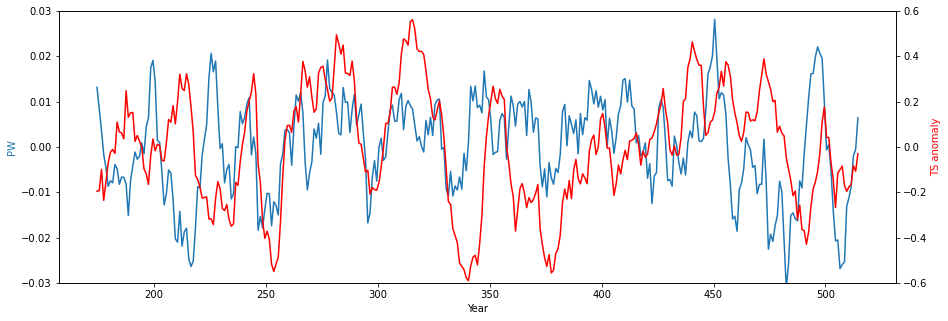

In [166]:
ts_ann = np.load('data/TS_ann.npy')

ts_arctic = np.mean(ts_ann[:,92:,:], axis=(1,2))
ts_arctic_movmean = signal.detrend(running_mean(ts_arctic, 10))

fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()

ax1.plot(t, THT, color="tab:blue", label='total heat transport anomaly')
#ax1.plot(t, siatl_movmean, color='tab:blue', linestyle='dashed', label='Atlantic')
#ax2.plot(t, oht, label="OHT", color=colors['OHT'])
ax2.plot(t, ts_arctic_movmean, color='r')

ax1.set_xlabel('Year')
ax1.set_ylabel('PW', color='tab:blue')
ax1.set_ylim([-0.03, 0.03])
ax2.set_ylabel('TS anomaly', color='r')
ax2.set_ylim([-0.6, 0.6])

print(stats.pearsonr(THT, ts_arctic_movmean))

## Lagged correlation

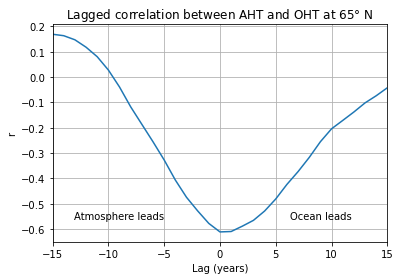

In [236]:
corr = []

oht = signal.detrend(OHT_ann_movmean)
aht = signal.detrend(AHT_ann_movmean[:,65])

nt = oht.size

for i in range(16):
    corr.insert(0, stats.pearsonr(aht[i:], oht[0:(nt-i)])[0])
    if not i == 0:
        corr.append(stats.pearsonr(oht[i:], aht[0:(nt-i)])[0])

t = np.linspace(-15,15,31)

plt.plot(t, corr)
plt.title("Lagged correlation between AHT and OHT at 65$\degree$ N")
plt.xlim([-15,15])
plt.grid(True)
plt.xlabel("Lag (years)")
plt.ylabel("r")
plt.text(-9,-.55,"Atmosphere leads", horizontalalignment='center', verticalalignment='center')
plt.text(9,-.55,"Ocean leads", horizontalalignment='center', verticalalignment='center')

plt.savefig("figures/lag_corr_65N.svg")

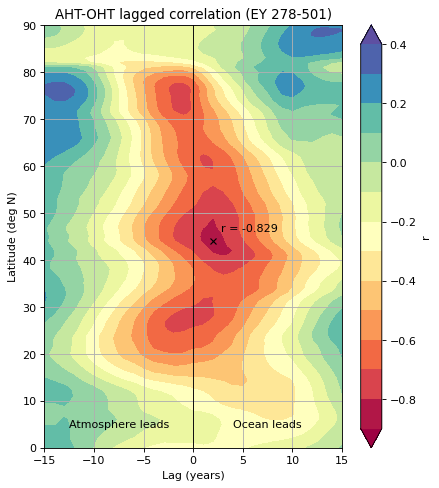

In [235]:
oht = signal.detrend(OHT_partial_movmean, axis=0)
aht = signal.detrend(AHT_partial_movmean, axis=0)

nt, nlat = oht.shape

corr = np.zeros((31, nlat))

for l in range(nlat):
    for i in range(16):
        corr[15-i, l] = stats.pearsonr(aht[i:, l], oht[0:(nt-i), l])[0]
        if not i == 0:
            corr[15+i, l] = stats.pearsonr(oht[i:, l], aht[0:(nt-i), l])[0]

t = np.linspace(-15,15,31)
lat = np.linspace(0, 90, 91)

figure(figsize = (6,7), dpi=80)
plt.contourf(t, lat, corr.T, np.arange(-0.9,0.5,0.1), cmap="Spectral", extend='both')
plt.plot([0,0], [0,90], color='k', linewidth=0.8)
plt.title("AHT-OHT lagged correlation (EY 278-501)")
plt.grid(True)
plt.xlabel("Lag (years)")
plt.ylabel("Latitude (deg N)")
cb = plt.colorbar()
cb.set_label("r")
plt.text(-7.5,5,"Atmosphere leads", horizontalalignment='center', verticalalignment='center')
plt.text(7.5,5,"Ocean leads", horizontalalignment='center', verticalalignment='center')
plt.plot(2, 44, 'x', color='k')
plt.text(2.8, 46, "r = " + str(np.round(np.min(corr), 3)))

plt.savefig("figures/lag_corr.svg")



(16, 55)


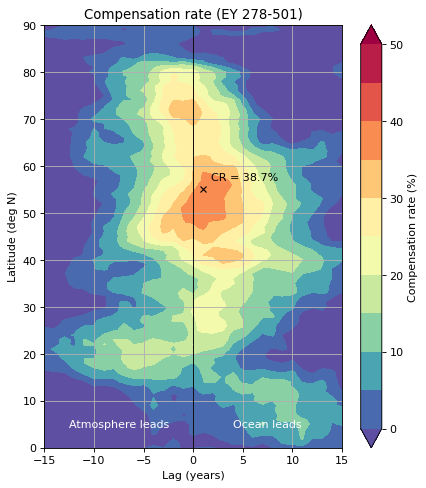

In [277]:
# do the same thing as above but for compensation rate
oht = signal.detrend(OHT_partial_movmean, axis=0)
aht = signal.detrend(AHT_partial_movmean, axis=0)

nt, nlat = oht.shape

crate = np.zeros((31, nlat))

for l in range(nlat):
    for i in range(16):
        crate[15-i, l] = calcCR(aht[i:, l], oht[0:(nt-i), l])
        if not i == 0:
            crate[15+i, l] = calcCR(oht[i:, l], aht[0:(nt-i), l])

t = np.linspace(-15,15,31)
lat = np.linspace(0, 90, 91)

ind = np.unravel_index(np.argmax(crate, axis=None), crate.shape)
print(ind)

figure(figsize = (6,7), dpi=80)
plt.contourf(t, lat, crate.T, np.arange(0,54,5), cmap="Spectral_r", extend='both')
plt.plot([0,0], [0,90], color='k', linewidth=0.8)
plt.title("Compensation rate (EY 278-501)")
plt.grid(True)
plt.xlabel("Lag (years)")
plt.ylabel("Latitude (deg N)")
cb = plt.colorbar()
cb.set_label("Compensation rate (%)")
plt.text(-7.5,5,"Atmosphere leads", horizontalalignment='center', verticalalignment='center', color='w')
plt.text(7.5,5,"Ocean leads", horizontalalignment='center', verticalalignment='center', color='w')
plt.plot(ind[0]-15, ind[1], 'x', color='k')
plt.text(ind[0]-14.2, ind[1]+2, "CR = " + str(np.round(np.max(crate), 1)) + "%")

plt.savefig("figures/lag_comp_rate.svg")



## Pacific and Atlantic sectors
minimum dependency: 1, 2, 3.2 

### Calculate AHT in Pacific and Atlantic sectors

In [12]:
def zonalSectorInt(flx, lon):
    nt, nlat, nlon = flx.shape
    area = np.load("data/area.npy")
    a = 6.3781e6     # radius of the earth in m
    
    # find the area integrated net flux for each grid cell
    fint = flx[:,:,lon[0]:lon[1]] * area[(257-nlat):,lon[0]:lon[1]] * a**2

    fxint = fint.sum(axis=2) # integrate zonally 

    fxyint = np.flip(np.cumsum(np.flip(fxint, axis=1), axis=1), axis=1) # integrate meridionally
    
    return fxyint

# in PW
aht_sector_terms = {}

sectors = {
    "Pacific": [256,512],
    "Atlantic": [0,256]
}

for term in flux_terms.keys():
    aht_sector_terms[term] = {}
    for sect in sectors.keys():
        # shift the discontinuity out of the atlantic
        flx = np.roll(flux_terms[term], 140, axis=2)
        
        aht_sector_terms[term][sect] = zonalSectorInt(flx, sectors[sect])/1e15



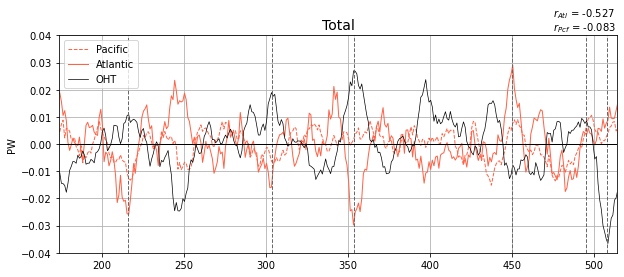

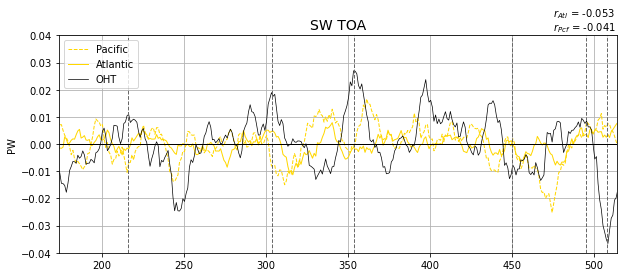

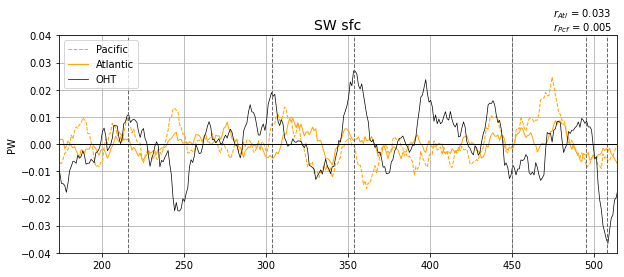

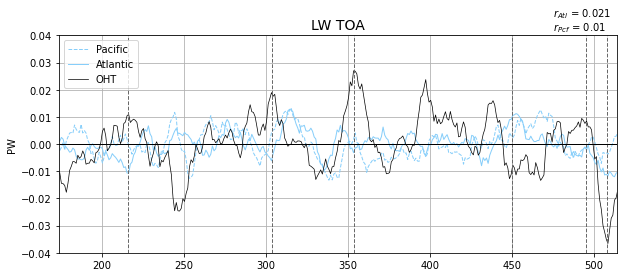

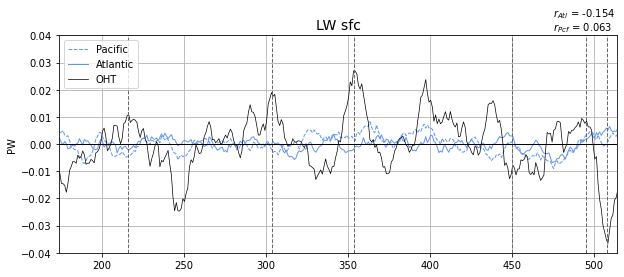

...

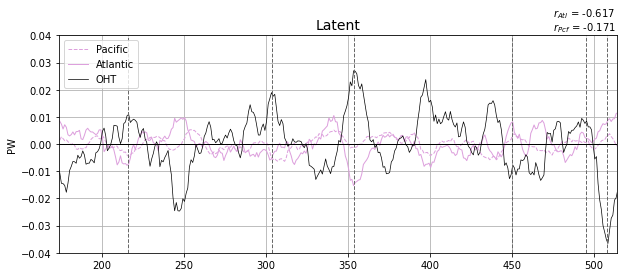

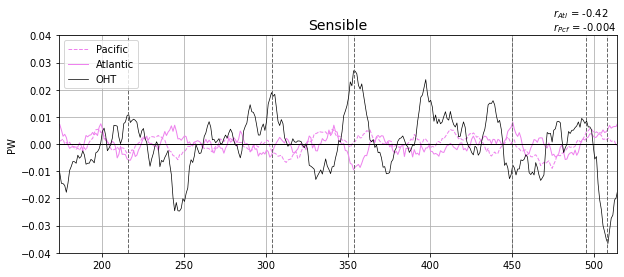

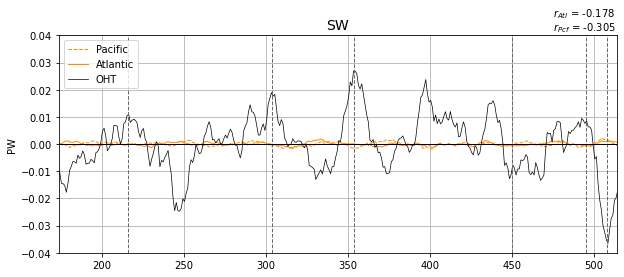

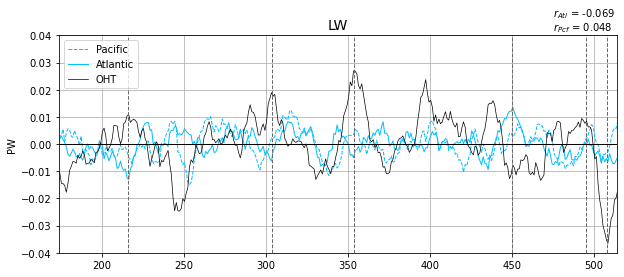

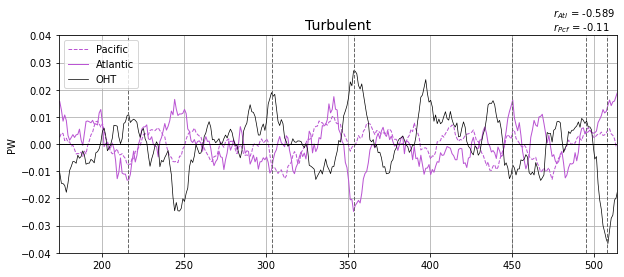

In [13]:
aht_sector_terms_filt = {}

aht_sector_corr = {}

style = {
    "Pacific": "dashed",
    "Atlantic": "solid"
}

t = np.linspace(174.5,514.5,341)

for term in aht_sector_terms.keys(): 
    
    plt.figure(figsize=(10,4))
    aht_sector_terms_filt[term] = {}
    aht_sector_corr[term] = {}
    
    for sect in aht_sector_terms[term].keys():
        term_filtered = signal.detrend(running_mean(aht_sector_terms[term][sect][:,93], 10))
        term_filtered -= np.mean(term_filtered)
        aht_sector_terms_filt[term][sect] = term_filtered
        
        # weight r such that r_Atl + r_Pcf = r_tot 
        weight = np.std(aht_sector_terms_filt[term][sect]) / np.std(aht_terms_filt[term])
        aht_sector_corr[term][sect] = stats.pearsonr(term_filtered, oht_norm)[0] * weight 
        
        plt.plot(t, term_filtered, 
                 linewidth=1, 
                 linestyle=style[sect], 
                 color=colors[term], 
                 label=sect)
        
    plt.title(term, fontsize=14)
    plt.xlim([174,514])
    plt.ylim([-0.04,0.04])
    plt.grid(True)
    plt.ylabel("PW")
    
    plt.plot(t,signal.detrend(oht_ann_movmean), color='k', linewidth=0.7, label='OHT')
    
    plt.text(475, 0.047, "$r_{Atl}$ = " + str(np.round(aht_sector_corr[term]["Atlantic"], 3)), fontsize=10)
    plt.text(475, 0.042, "$r_{Pcf}$ = " + str(np.round(aht_sector_corr[term]["Pacific"], 3)), fontsize=10)
    
    plt.legend(loc='upper left')
        
    #plt.plot(t, aht_sector_terms_filt[term]["Atlantic"] + aht_sector_terms_filt[term]["Pacific"],
    #         label=term, color=colors[term])
    #plt.plot(t, aht_terms_filt[term]/1e15, linestyle="dotted", color='k')

    plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=354, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=495, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=508, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axvline(x=304, color='dimgrey', linewidth=1, linestyle='dashed')
    plt.axhline(color='k', linewidth=1)
    
    #plt.savefig(f"figures/aht_sectors/{term}.png")

**Above**: the Atlantic fluxes dominate the AHT response because most of the turbulent heat flux variability due to OHT is in the Atlantic. The Pacific sector dominates the shortwave response, because there is more sea ice (and more sea ice variability) in the Pacific sector. 

**Expected**: Higher OHT -> warmer ocean surface -> greater sfc LW into atmosphere -> atmosphere warms -> greater TOA LW loss into space

**Observed**: higher OHT -> warmer ocean surface -> greater sfc LW into atmosphere -> **LESS** TOA LW loss into space. Why? 

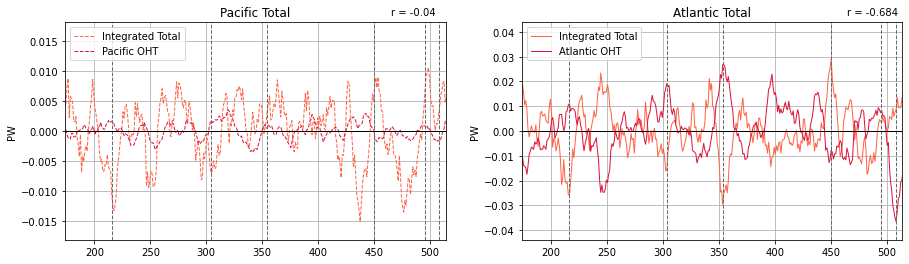

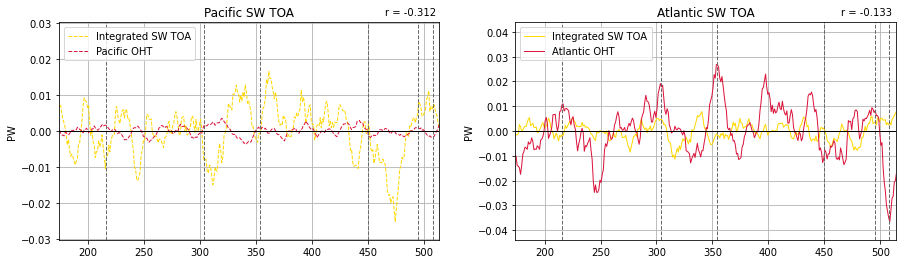

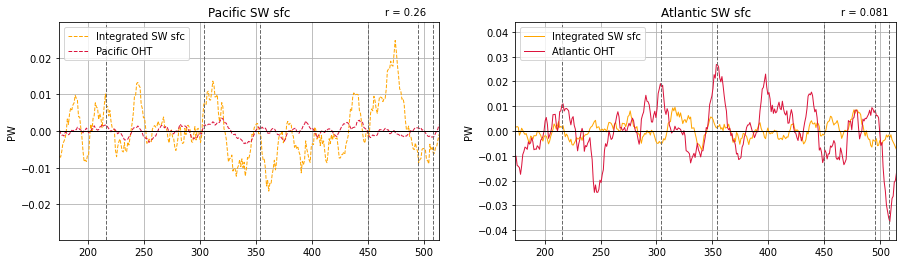

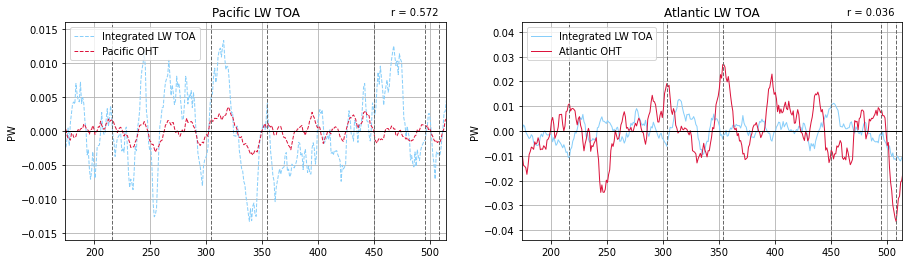

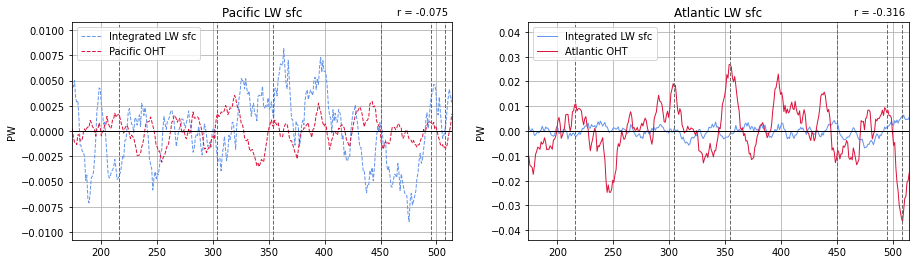

...

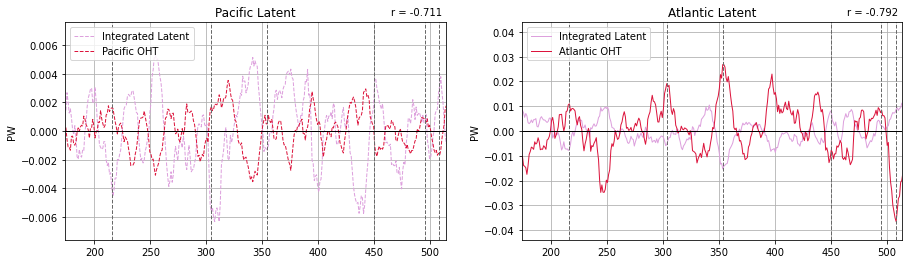

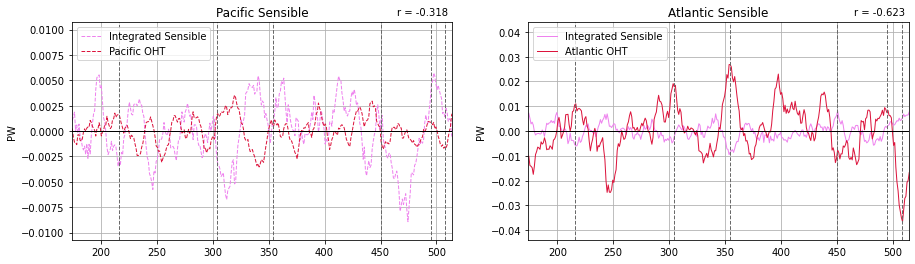

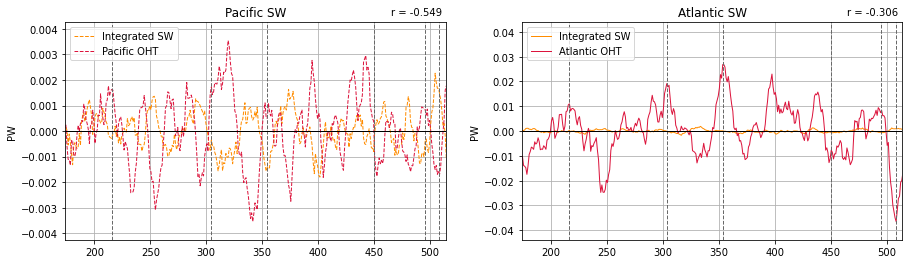

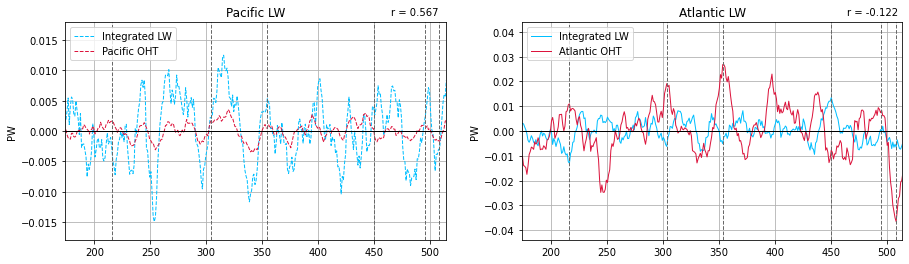

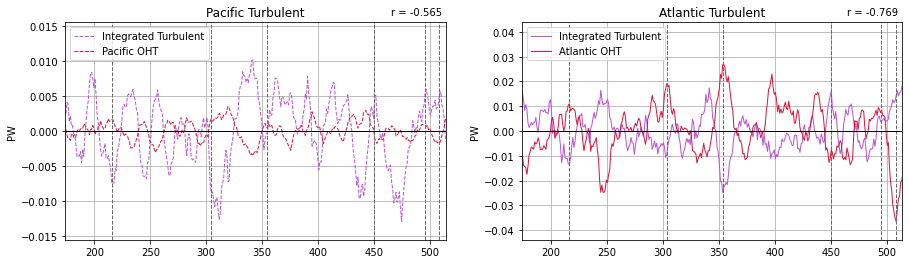

In [14]:
oht_comp = {
    "Global": xr.open_dataset(ocndir + "vTFlux_65N_Global.nc").variables['vTFlux_65N_Global'][169:],
    "GSR": xr.open_dataset(ocndir + "vTFlux_65N_GSR.nc").variables['vTFlux_65N_GSR'][169:],
    "Bering": xr.open_dataset(ocndir + "vTFlux_65N_Bering.nc").variables['vTFlux_65N_Bering'][169:],
    "Davis": xr.open_dataset(ocndir + "vTFlux_65N_Davis.nc").variables['vTFlux_65N_Davis'][169:]
}

oht_comp["Residual"] = oht_comp["Global"]-oht_comp["GSR"]-oht_comp["Bering"]-oht_comp["Davis"]

oht_filt = {}

oht_filt["Pacific"] = signal.detrend(running_mean(oht_comp["Bering"], 10))
oht_filt["Atlantic"] = signal.detrend(running_mean(oht_comp["Global"] - oht_comp["Bering"], 10))
oht_filt["Total"] = signal.detrend(running_mean(oht_comp["Global"], 10))

for term in aht_sector_terms_filt.keys():
    plt.figure(figsize=(15,4))
    
    for i,sect in enumerate(aht_sector_terms_filt[term].keys()): 
        plt.subplot(1,2,i+1)
        plt.plot(t, aht_sector_terms_filt[term][sect], 
                 linewidth=1, 
                 linestyle=style[sect], 
                 color=colors[term], 
                 label=f'Integrated {term}')
        plt.plot(t, oht_filt[sect], 
                linewidth=1,
                linestyle=style[sect],
                color=colors['OHT'], 
                label=f'{sect} OHT')
        plt.title(f"{sect} {term}")
        
        plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axvline(x=354, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axvline(x=495, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axvline(x=508, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axvline(x=304, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axhline(color='k', linewidth=1)
        
        plt.xlim([174,514])
        
        bound = np.max([np.abs(aht_sector_terms_filt[term][sect]), np.abs(oht_filt[sect])]) * 1.2
        
        plt.ylim([-bound, bound])
        plt.grid(True)
        plt.ylabel("PW")
        plt.legend(loc='upper left')
        
        r = np.round(stats.pearsonr(aht_sector_terms_filt[term][sect], oht_filt[sect])[0], 3)
        plt.text(465, bound*1.07, f'r = {r}')
    
    #plt.savefig(f"figures/sector_decomp/png/{term}.png")
    #plt.savefig(f"figures/sector_decomp/svg/{term}.svg")

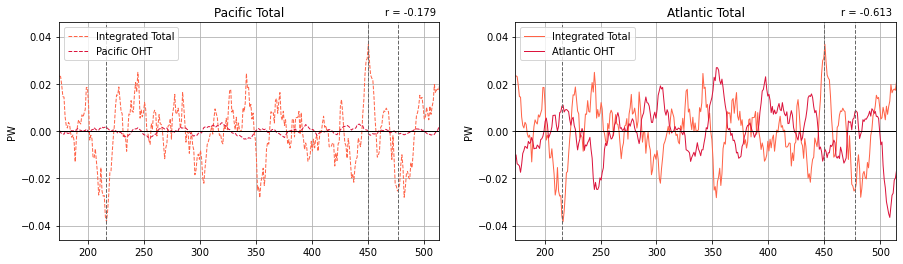

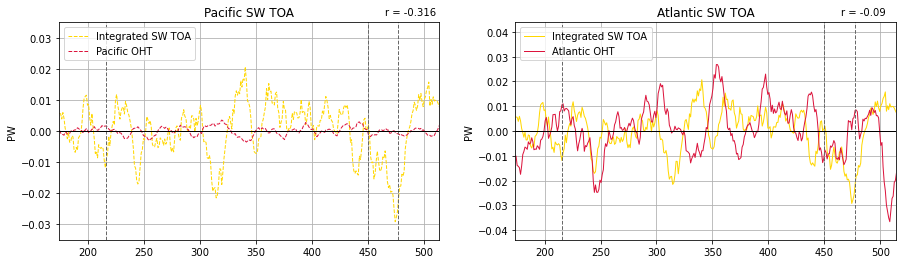

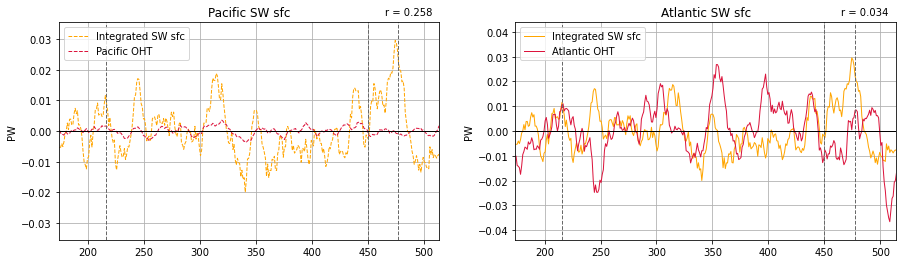

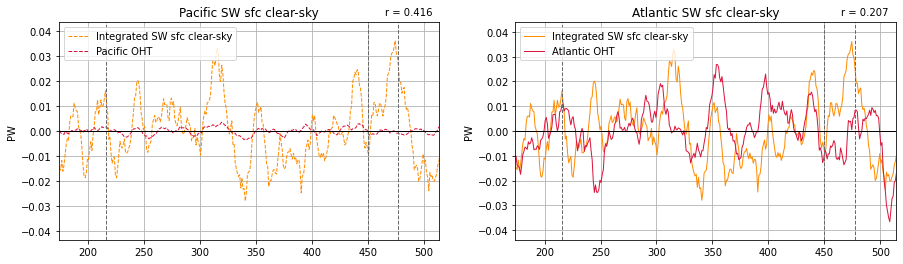

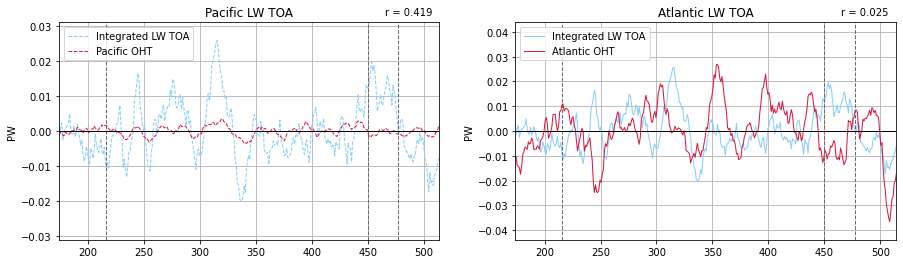

...

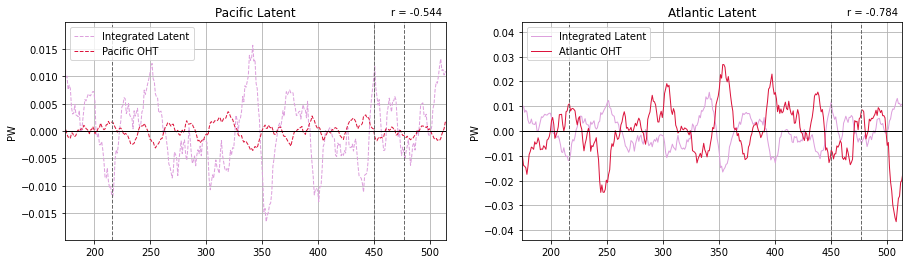

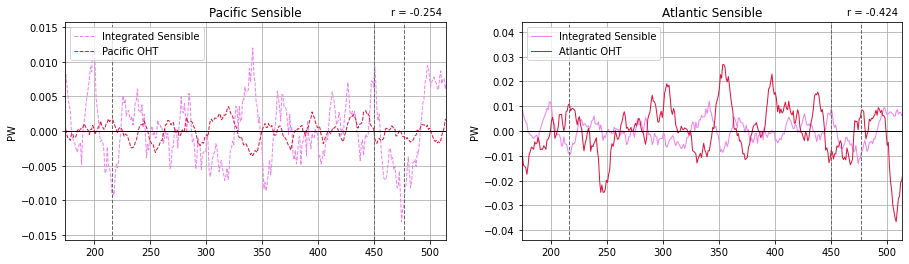

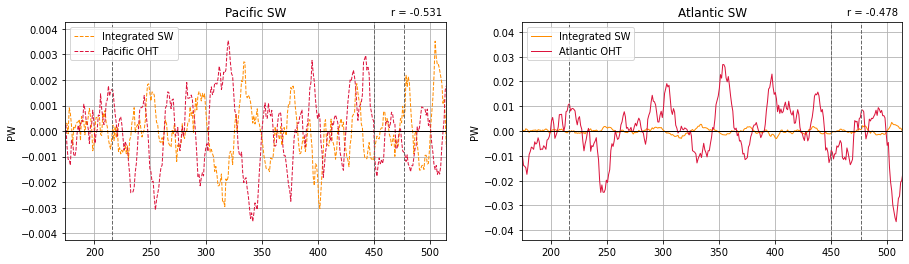

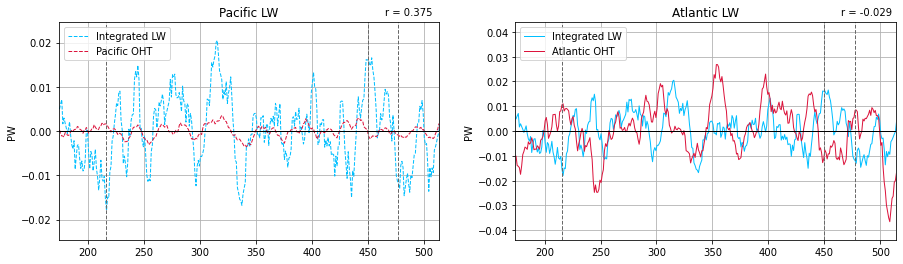

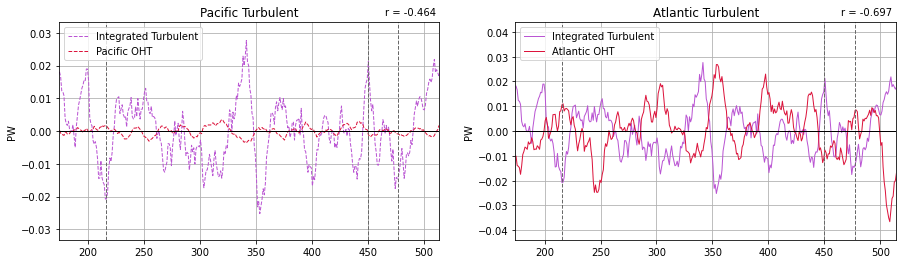

In [14]:
oht_comp = {
    "Global": xr.open_dataset(ocndir + "vTFlux_65N_Global.nc").variables['vTFlux_65N_Global'][169:],
    "GSR": xr.open_dataset(ocndir + "vTFlux_65N_GSR.nc").variables['vTFlux_65N_GSR'][169:],
    "Bering": xr.open_dataset(ocndir + "vTFlux_65N_Bering.nc").variables['vTFlux_65N_Bering'][169:],
    "Davis": xr.open_dataset(ocndir + "vTFlux_65N_Davis.nc").variables['vTFlux_65N_Davis'][169:]
}

oht_comp["Residual"] = oht_comp["Global"]-oht_comp["GSR"]-oht_comp["Bering"]-oht_comp["Davis"]

oht_filt = {}

oht_filt["Pacific"] = signal.detrend(running_mean(oht_comp["Bering"], 10))
oht_filt["Atlantic"] = signal.detrend(running_mean(oht_comp["Global"] - oht_comp["Bering"], 10))
oht_filt["Total"] = signal.detrend(running_mean(oht_comp["Global"], 10))

for term in aht_sector_terms_filt.keys():
    plt.figure(figsize=(15,4))
    
    
    for i,sect in enumerate(aht_sector_terms_filt[term].keys()):        
        plt.subplot(1,2,i+1)
        plt.plot(t, aht_terms_filt[term], 
                 linewidth=1, 
                 linestyle=style[sect], 
                 color=colors[term], 
                 label=f'Integrated {term}')
        plt.plot(t, oht_filt[sect], 
                linewidth=1,
                linestyle=style[sect],
                color=colors['OHT'], 
                label=f'{sect} OHT')
        plt.title(f"{sect} {term}")
        
        plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')
        plt.axhline(color='k', linewidth=1)
        
        plt.xlim([174,514])
        
        bound = np.max([np.abs(aht_terms_filt[term]), np.abs(oht_filt[sect])]) * 1.2
        
        plt.ylim([-bound, bound])
        plt.grid(True)
        plt.ylabel("PW")
        plt.legend(loc='upper left')
        
        r = np.round(stats.pearsonr(aht_terms_filt[term], oht_filt[sect])[0], 3)
        plt.text(465, bound*1.07, f'r = {r}')
    
    #plt.savefig(f"figures/sector_decomp/png/{term}.png")
    #plt.savefig(f"figures/sector_decomp/svg/{term}.svg")

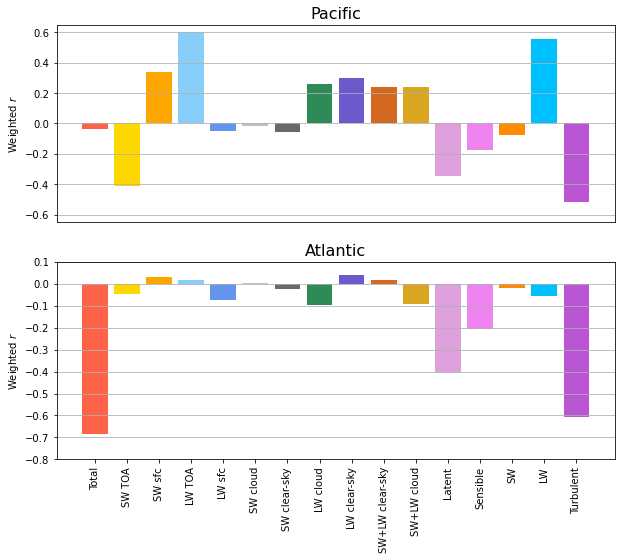

In [26]:
aht_sector_separate_corr = {}

for sect in ["Pacific", "Atlantic"]:
    aht_sector_separate_corr[sect] = {}

    for term in aht_sector_terms_filt.keys(): 
        weight = aht_sector_terms_filt[term][sect].std() / aht_sector_terms_filt["Total"][sect].std()
        aht_sector_separate_corr[sect][term] = weight * stats.pearsonr(aht_sector_terms_filt[term][sect], oht_filt[sect])[0]

figure(figsize=(10,8))
plt.subplot(2,1,1)
plt.xticks([])
plt.bar(aht_sector_separate_corr["Pacific"].keys(), aht_sector_separate_corr["Pacific"].values(), color=colors.values())
plt.title("Pacific", fontsize=16)
plt.grid(True, axis='y')
plt.ylim([-0.65, 0.65])
plt.ylabel("Weighted $r$")

plt.subplot(2,1,2)
plt.xticks(rotation='vertical')
plt.bar(aht_sector_separate_corr["Atlantic"].keys(), aht_sector_separate_corr["Atlantic"].values(), color=colors.values())
plt.title("Atlantic", fontsize=16)
plt.grid(True, axis='y')
plt.ylabel("Weighted $r$")
plt.ylim([-0.8, 0.1])

plt.savefig("figures/AHT_sector_corr_decomposition.svg", bbox_inches="tight")

### Multiple linear regression

Fits the model $AHT_{sector} = a_1OHT_{Pcf} + a_2OHT_{Atl}$. The $p$ value is the probability that we can reject the null hypothesis that there is no relationship between $AHT_{sector}$ and the regressor. 

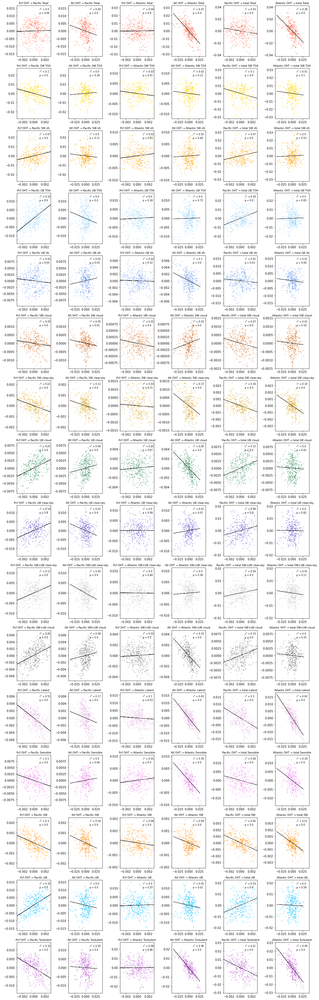

In [32]:
plt.figure(figsize=(15,48))

for i,term in enumerate(aht_sector_terms_filt.keys()):
    
    for j,sect in enumerate(aht_sector_terms_filt[term].keys()):
        
        # fit the sector AHT in terms of the two OHT components (Atl and Pcf) 
        fit = sm.OLS(aht_sector_terms_filt[term][sect], np.array(list([oht_filt["Pacific"], oht_filt["Atlantic"]])).T).fit()
        a,b = fit.params
        r1 = np.round(stats.pearsonr(aht_sector_terms_filt[term][sect], oht_filt["Pacific"])[0]**2, 2)
        r2 = np.round(stats.pearsonr(aht_sector_terms_filt[term][sect], oht_filt["Atlantic"])[0]**2, 2)
        r3 = np.round(stats.pearsonr(aht_terms_filt[term]/1e15, oht_filt[sect])[0]**2, 2)
        p1, p2 = np.round(fit.pvalues, 2)
        
        bound = np.max(np.abs(aht_sector_terms_filt[term][sect]))
        
        plt.subplot(len(aht_sector_terms_filt), 6, i*6 + j*2+1)
        plt.scatter(oht_filt["Pacific"], aht_sector_terms_filt[term][sect], s=1, color=colors[term])
        plt.plot(oht_filt["Pacific"], oht_filt["Pacific"] * a, color='k', linewidth=1)
        plt.title(f'Pcf OHT → {sect} {term}', fontsize=9)
        plt.xlim([-0.003,0.003])
        plt.ylim([-bound*1.1, bound*1.1])
        
        plt.text(0.001, bound*0.75, f'p = {p1}', fontsize=8)
        plt.text(0.001, bound*0.9, "$r^2$ = " + str(r1), fontsize=8)
        
        plt.subplot(len(aht_sector_terms_filt), 6, i*6 + j*2+2)
        plt.scatter(oht_filt["Atlantic"], aht_sector_terms_filt[term][sect], s=1, color=colors[term])
        plt.plot(oht_filt["Atlantic"], oht_filt["Atlantic"] * b, color='k', linewidth=0.7)
        plt.title(f'Atl OHT → {sect} {term}', fontsize=9)
        plt.xlim([-0.04,0.04])
        plt.ylim([-bound*1.1, bound*1.1])
        
        plt.text(0.01, bound*0.75, f'p = {p2}', fontsize=8)
        plt.text(0.01, bound*0.9, "$r^2$ = " + str(r2), fontsize=8)
        
        #print(term, sect, fit.params)
        
        fit = sm.OLS(aht_terms_filt[term]/1e15, oht_filt[sect]).fit()
        a = fit.params
        p1 = np.round(fit.pvalues, 2)[0]
        bound = np.max(np.abs(aht_terms_filt[term]/1e15))

        plt.subplot(len(aht_sector_terms_filt), 6, i*6 + j + 5)
        plt.scatter(oht_filt[sect], aht_terms_filt[term]/1e15, s=1, color=colors[term])
        plt.plot(oht_filt[sect], oht_filt[sect] * a, color='k', linewidth=0.7)
        plt.title(f'{sect} OHT → total {term}', fontsize=9)
        
        xlim = [-0.003,0.003] if j == 0 else [-0.04,0.04]
        plt.xlim(xlim)
        plt.ylim([-bound*1.1, bound*1.1])
        plt.text(xlim[1]/4, bound*0.9, "$r^2$ = " + str(r3), fontsize=8)
        plt.text(xlim[1]/4, bound*0.75, f'p = {p1}', fontsize=8)

plt.tight_layout()
#plt.savefig("figures/linreg_plots.pdf")

The Pacific OHT has a significant, outsized effect on the atmospheric radiative budget due to its effect on the sea ice variability in the Pacific sector. It is remarkable that the Bering Strait OHT variability, $O(1 \; \mathrm{TW})$, generates a much stronger sea ice response than the Atlantic OHT $O(10 \; \mathrm{TW})$.  

The Atlantic OHT variability is also more weakly related to both the total clear-sky and total cloud responses than the Pacific OHT variability. The "hidden" Pacific OHT variability can generate significant responses in AHT that doesn't correspond well with the total OHT variability, since the total OHT variability is dominated by the Atlantic. 



### Relative contributions of OHT to AHT response
Since the magnitudes of Bering Strait OHT variability and Atlantic OHT variability are different and the Bering Strait seems to have an outsized impact on the radiative response, here I calculate the compensation ratio of each AHT term for the Pacific and Atlantic OHT separately. 

$$CR_{ij} = \left(\frac{\sigma(AHT_i)}{\sigma(OHT_j)}\right)Corr(AHT_i, OHT_j)$$

$$
\begin{align*}
CR_{tot} &= \rho Corr(AHT,OHT) \\
         &= \rho \sum_j \left[\left(\frac{\sigma(OHT_j)}{\sigma(OHT)}\right) Corr(AHT,OHT_j)\right] \\
         &= \rho \sum_j \left[\left(\frac{\sigma(OHT_j)}{\sigma(OHT)}\right) \sum_i \left( \left(\frac{\sigma(AHT_i)}{\sigma(AHT)}\right)Corr(AHT_i, OHT_j)\right) \right] \\
         &= \sum_{ij} \left[\left(\frac{\sigma(OHT_j)}{\sigma(OHT)}\right)^2 CR_{ij}\right]
\end{align*}
$$

$$\rho = \left(\frac{\sigma(AHT)}{\sigma(OHT)}\right)$$

$$
\begin{align*}
CR_{j} &= \left(\frac{\sigma(AHT)}{\sigma(OHT_j)}\right) Corr(AHT,OHT_j) \\
         &= \left(\frac{\sigma(AHT)}{\sigma(OHT_j)}\right) \left[\sum_i \left( \left(\frac{\sigma(AHT_i)}{\sigma(AHT)}\right)Corr(AHT_i, OHT_j)\right) \right] \\
         &= \left(\frac{\sigma(AHT)}{\sigma(OHT_j)}\right) \left[\sum_i \left( \left(\frac{\sigma(AHT_i)}{\sigma(AHT)}\right)\left(\frac{\sigma(OHT_j)}{\sigma(AHT_i)}\right)CR_{ij}\right) \right] \\
         &= \sum_i CR_{ij}
\end{align*}
$$

total: -0.6815478384126181, sum of major components: -0.22042259469740194
total Pcf: -0.02467597930766138, sum of major Pcf components: 0.013063659847812374
total Atl: -0.6568718591049567, sum of major Atl components: -0.23348625454521432
total: -0.6815478384126181, sum of minor components: -0.48612581770747043


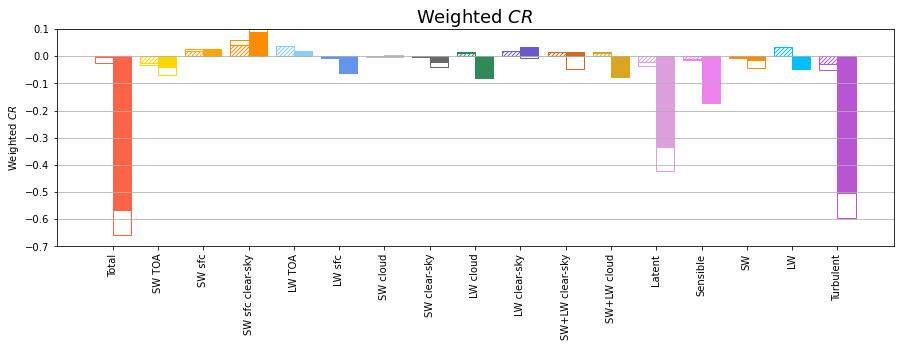

In [25]:
# weighted to be totally-additive
crates = {}

# weighted to be sector-additive 
crates_sw = {}

weights = {
    "Pacific": (oht_filt["Pacific"].std()/oht_filt["Total"].std())**2,
    "Atlantic": (oht_filt["Atlantic"].std()/oht_filt["Total"].std())**2
}

for term in aht_terms_filt.keys():
    crates[term] = []
    crates_sw[term] = []
    for sect in ["Pacific", "Atlantic"]:
        for ssect in ["Pacific", "Atlantic"]: 
            ratio = (aht_sector_terms_filt[term][ssect]).std()/oht_filt[sect].std()
            r = stats.pearsonr(aht_sector_terms_filt[term][ssect], oht_filt[sect])[0]
            modCR = weights[sect] * ratio * r
            crates[term].append(modCR)
            
            CR = ratio * r
            crates_sw[term].append(CR)
            #print(f'{term}: {sect} -> {ssect}: \n CRij = {modCR} \n weight = {weights[sect]} \n r = {r} \n ratio = {ratio} \n')
# [Pcf->Pcf, Pcf->Atl, Atl->Pcf, Atl->Atl]

crates_np = np.array(list(crates.values()))
n = len(crates)
r = np.arange(n)
w = 0.4

figure(figsize=(15,4))
plt.xticks(rotation='vertical')
plt.bar(r, crates_np[:,0], width=w, color='none', hatch='/'*6, edgecolor=colors.values())
plt.bar(r, crates_np[:,1], width=w, color='none', edgecolor=colors.values(), bottom=crates_np[:,0])
plt.bar(r+w, crates_np[:,3], width=w, edgecolor=colors.values(), color=colors.values())
plt.bar(r+w, crates_np[:,2], width=w, color='none', edgecolor=colors.values(), bottom=crates_np[:,3])
plt.title("Weighted $CR$", fontsize=18)
plt.ylim([-0.7, 0.1])
plt.xticks(r + w/2, crates.keys())
plt.grid(True, axis='y')
plt.ylabel("Weighted $CR$")

print(f'total: {crates_np[0].sum()}, sum of major components: {crates_np[13:16].sum()}')
print(f'total Pcf: {crates_np[0,0:2].sum()}, sum of major Pcf components: {crates_np[13:16,0:2].sum()}')
print(f'total Atl: {crates_np[0,2:4].sum()}, sum of major Atl components: {crates_np[13:16,2:4].sum()}')
print(f'total: {crates_np[0].sum()}, sum of minor components: {crates_np[9:13].sum()}')

plt.savefig("figures/weighted_CR")

Text(0, 0.5, 'Weighted $CR$ (Atl)')

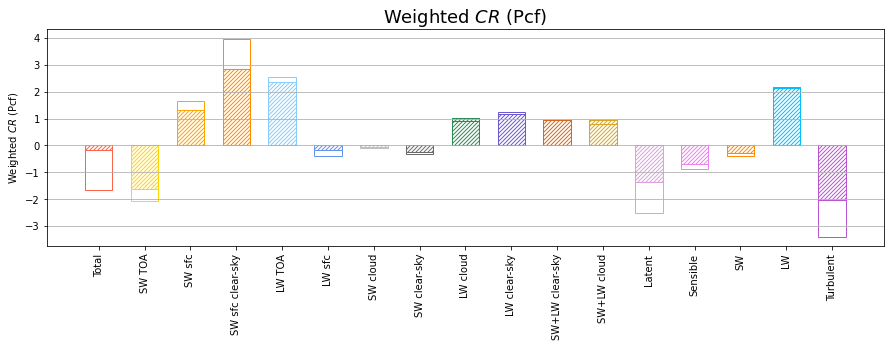

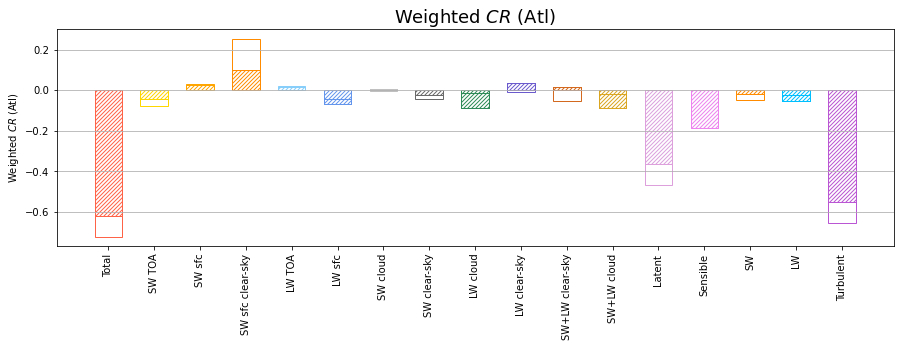

In [21]:
crates_np = np.array(list(crates_sw.values()))

figure(figsize=(15,4))
w=0.6
plt.xticks(rotation='vertical')
plt.bar(r, crates_np[:,0], width=w, color='none', hatch='/'*6, edgecolor=colors.values())
plt.bar(r, crates_np[:,1], width=w, color='none', edgecolor=colors.values(), bottom=crates_np[:,0])
plt.title("Weighted $CR$ (Pcf)", fontsize=18)
#plt.ylim([, 0.6])
plt.xticks(r, crates.keys())
plt.grid(True, axis='y')
plt.ylabel("Weighted $CR$ (Pcf)")

figure(figsize=(15,4))
w=0.6
plt.xticks(rotation='vertical')
plt.bar(r, crates_np[:,3], width=w, color='none', hatch='/'*6, edgecolor=colors.values())
plt.bar(r, crates_np[:,2], width=w, color='none', edgecolor=colors.values(), bottom=crates_np[:,3])
plt.title("Weighted $CR$ (Atl)", fontsize=18)
#plt.ylim([-0.7, 0.1])
plt.xticks(r, crates.keys())
plt.grid(True, axis='y')
plt.ylabel("Weighted $CR$ (Atl)")


### Covariance between Pcf and Atl OHT

r = 0.3206


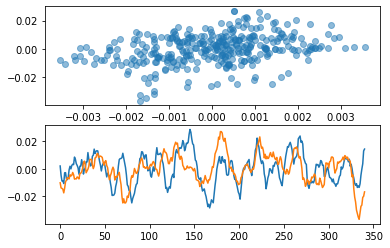

In [36]:
# run some diagnostics 

plt.subplot(2,1,1)
plt.scatter(oht_filt["Pacific"], oht_filt['Atlantic'], alpha=0.5)

plt.subplot(2,1,2)
plt.plot(oht_filt["Pacific"]*8) # Pcf scaled to similar magnitude 
plt.plot(oht_filt['Atlantic'])

r = stats.pearsonr(oht_filt['Pacific'], oht_filt['Atlantic'])[0]
print(f'r = {np.round(r,4)}')

Pacific variance: 1.0
Atlantic variance: 1.0000000000000002
Total variance: 0.9999999999999998

OHT_pcf = 2.49394 * OHT_Atl



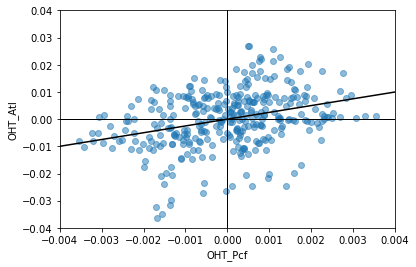

In [53]:
oht_norm = dict()

# normalize the OHT timeseries so they have a variance of 1
for term in oht_filt.keys():
    oht_norm[term] = oht_filt[term]/oht_filt[term].std()
    print(f'{term} variance: {oht_norm[term].var()}')

# find the best-fit line
regr = linear_model.LinearRegression().fit(oht_filt['Pacific'].reshape(-1,1), oht_filt['Atlantic'])
coef = regr.coef_[0]
print(f'\nOHT_pcf = {np.round(coef,5)} * OHT_Atl\n')

x = np.linspace(-0.04,0.04,2)
plt.scatter(oht_filt['Pacific'], oht_filt['Atlantic'], alpha=0.5)
plt.plot(x, coef*x, color='k')

plt.xlabel('OHT_Pcf')
plt.ylabel('OHT_Atl')

plt.ylim(-.04,.04)
plt.xlim(-.004,.004)

plt.axhline(color='k', linewidth=1)
plt.axvline(color='k', linewidth=1)

r_decorr = 0.0
r_original = 0.32064


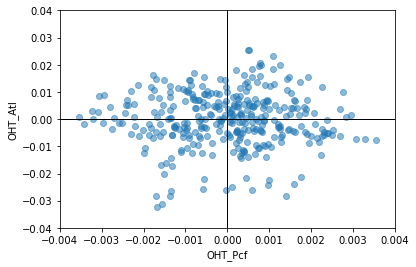

In [78]:
oht_covarying = coef * oht_filt['Pacific']

plt.scatter(oht_filt['Pacific'], oht_filt['Atlantic'] - oht_covarying, alpha=0.5)

plt.xlabel('OHT_Pcf')
plt.ylabel('OHT_Atl')

plt.ylim(-.04,.04)
plt.xlim(-.004,.004)

plt.axhline(color='k', linewidth=1)
plt.axvline(color='k', linewidth=1)


# verify that the timeseries are decorrelated 
r = stats.pearsonr(oht_filt['Pacific'], oht_filt['Atlantic'])[0]
r_decorr = stats.pearsonr(oht_filt['Pacific'], oht_filt['Atlantic'] - oht_covarying)[0]
print(f'r_decorr = {np.round(r_decorr, 5)}')
print(f'r_original = {np.round(r, 5)}')


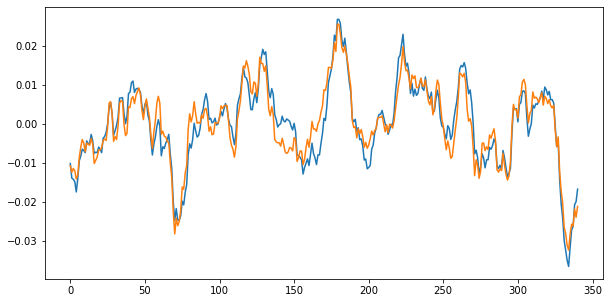

In [358]:
figure(figsize=(10,5))

plt.plot(oht_filt["Atlantic"])
plt.plot(oht_filt['Atlantic'] - oht_covarying)

In [360]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

array = np.zeros((oht_filt['Pacific'].size, 2))
array[:, 0] = oht_filt['Pacific']
array[:, 1] = oht_filt['Atlantic']

scaled_array = StandardScaler().fit_transform(array)

# PCA decomposition
model = PCA()
model_no_norm = PCA()
pca = model.fit_transform(scaled_array)
pca_no_norm = model_no_norm.fit_transform(array)

exp_var = model.explained_variance_ # the eigenvalues of the covariance matrix 
exp_var_r = model.explained_variance_ratio_

comps = model.components_
comps_no_norm = model_no_norm.components_



oht_decorr = pca * [oht_filt['Atlantic'].std(), oht_filt['Pacific'].std()]




corr(PC1, PC2) = 2.688821387764051e-17


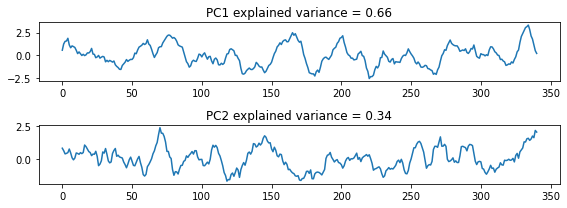

In [274]:
figure(figsize=(8,3))

plt.subplot(2,1,1)
plt.plot(pca[:,0])
#plt.plot(scaled_array[:,0])
plt.title(f'PC1 explained variance = {np.round(exp_var_r[0], 3)}')

plt.subplot(2,1,2) t
plt.plot(pca[:,1])
#plt.plot(scaled_array[:,1])
plt.title(f'PC2 explained variance = {np.round(exp_var_r[1], 3)}')

plt.tight_layout()

print(f'corr(PC1, PC2) = {stats.pearsonr(pca[:,0], pca[:,1])[0]}')


corr(PC1, PC2) = 1.8995222061946038e-16


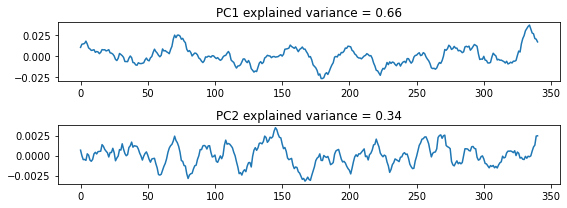

In [365]:
figure(figsize=(8,3))

plt.subplot(2,1,1)
plt.plot(pca_no_norm[:,0])
#plt.plot(scaled_array[:,0])
plt.title(f'PC1 explained variance = {np.round(exp_var_r[0], 3)}')

plt.subplot(2,1,2) 
plt.plot(pca_no_norm[:,1])
#plt.plot(scaled_array[:,1])
plt.title(f'PC2 explained variance = {np.round(exp_var_r[1], 3)}')

plt.tight_layout()

print(f'corr(PC1, PC2) = {stats.pearsonr(pca_no_norm[:,0], pca_no_norm[:,1])[0]}')


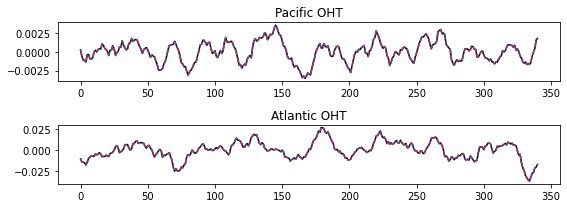

In [283]:
# reconstruct the original timeseries using the eigenvectors and then de-normalizing 

oht_std = [oht_filt['Pacific'].std(), oht_filt['Atlantic'].std()]
oht_recon = np.matmul(pca, comps) * oht_std

# double check the reconstruction is correct 
figure(figsize=(8,3))

plt.subplot(2,1,1)
plt.plot(oht_filt['Pacific'], color='k') # original
plt.plot(oht_recon[:,0], color=colors['OHT'], linestyle='dashed') # reconstruction 1 
plt.plot(oht_filt['Pacific'].std() * np.sum(pca * np.flip(comps[1,:]), axis=1), linestyle='dotted') # reconstruction 2
plt.title("Pacific OHT")

plt.subplot(2,1,2)
plt.plot(oht_filt['Atlantic'], color='k')
plt.plot(oht_recon[:,1], color=colors['OHT'], linestyle='dashed')
plt.plot(oht_filt['Atlantic'].std() * np.sum(pca * comps[0,:], axis=1), linestyle='dotted')
plt.title("Atlantic OHT")

plt.tight_layout()

[[-0.70710678 -0.70710678]
 [ 0.70710678 -0.70710678]]
Corr(PC1, OHT_Atl) = 0.8126020120671451
Corr(PC2, OHT_Atl) = 0.5828189856073904
Corr(PC1, OHT_Pcf) = 0.8126020120671449
Corr(PC2, OHT_Pcf) = 0.5828189856073904


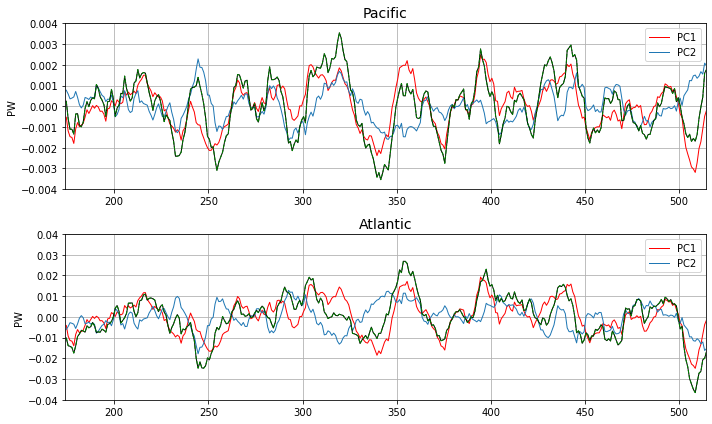

In [349]:
# isolate the PCs weighted by eigenvectors; these sum to the original timeseries
# first element is PC1, second is PC2 

print(comps)

oht_pca_comp = {
    "Atlantic": oht_std[1] * pca * comps[0,:],
    "Pacific": oht_std[0] * pca * np.flip(comps[1,:])
}

figure(figsize=(10,6))

plt.subplot(2,1,1)
plt.plot(t, oht_pca_comp["Pacific"][:,0], color='r', linewidth=1, label='PC1')
plt.plot(t, oht_pca_comp["Pacific"][:,1], color='tab:blue', linewidth=1, label='PC2')
plt.plot(t, oht_pca_comp["Pacific"][:,0] + oht_pca_comp["Pacific"][:,1], color='k', linewidth=1)
plt.plot(t, oht_filt["Pacific"], color='g', linewidth=1, linestyle='dashed')

plt.title("Pacific", fontsize=14)
plt.xlim([174,514])
plt.ylim([-0.004,0.004])
plt.grid(True)
plt.legend()
plt.ylabel("PW")

plt.subplot(2,1,2)
plt.plot(t, oht_pca_comp["Atlantic"][:,0], color='r', linewidth=1, label='PC1')
plt.plot(t, oht_pca_comp["Atlantic"][:,1], color='tab:blue', linewidth=1, label='PC2')
plt.plot(t, oht_pca_comp["Atlantic"][:,0] + oht_pca_comp["Atlantic"][:,1], color='k', linewidth=1)
plt.plot(t, oht_filt["Atlantic"], color='g', linewidth=1, linestyle='dashed')


plt.title("Atlantic", fontsize=14)
plt.xlim([174,514])
plt.ylim([-0.04,0.04])
plt.grid(True)
plt.legend()
plt.ylabel("PW")

plt.tight_layout()

print(f'Corr(PC1, OHT_Atl) = {stats.pearsonr(oht_pca_comp["Atlantic"][:,0], oht_filt["Atlantic"])[0]}')
print(f'Corr(PC2, OHT_Atl) = {stats.pearsonr(oht_pca_comp["Atlantic"][:,1], oht_filt["Atlantic"])[0]}')

print(f'Corr(PC1, OHT_Pcf) = {stats.pearsonr(oht_pca_comp["Pacific"][:,0], oht_filt["Pacific"])[0]}')
print(f'Corr(PC2, OHT_Pcf) = {stats.pearsonr(oht_pca_comp["Pacific"][:,1], oht_filt["Pacific"])[0]}')



[[-0.04180786 -0.99912567]
 [ 0.99912567 -0.04180786]]
Corr(PC1, OHT_Atl) = 0.9999870611094238
Corr(PC2, OHT_Atl) = 0.005087004397211666
Corr(PC1, OHT_Pcf) = 0.32545832060071617
Corr(PC2, OHT_Pcf) = 0.9455563872936195


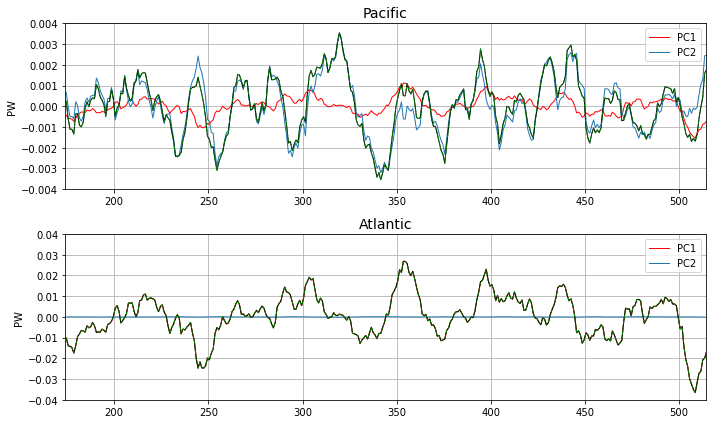

In [370]:
print(comps_no_norm)

oht_pca_comp = {
    "Atlantic": pca_no_norm * np.flip(comps_no_norm[0,:]),
    "Pacific": pca_no_norm * np.flip(comps_no_norm[1,:])
}

figure(figsize=(10,6))

plt.subplot(2,1,1)
plt.plot(t, oht_pca_comp["Pacific"][:,0], color='r', linewidth=1, label='PC1')
plt.plot(t, oht_pca_comp["Pacific"][:,1], color='tab:blue', linewidth=1, label='PC2')
plt.plot(t, oht_pca_comp["Pacific"][:,0] + oht_pca_comp["Pacific"][:,1], color='k', linewidth=1)
plt.plot(t, oht_filt["Pacific"], color='g', linewidth=1, linestyle='dashed')

plt.title("Pacific", fontsize=14)
plt.xlim([174,514])
plt.ylim([-0.004,0.004])
plt.grid(True)
plt.legend()
plt.ylabel("PW")

plt.subplot(2,1,2)
plt.plot(t, oht_pca_comp["Atlantic"][:,0], color='r', linewidth=1, label='PC1')
plt.plot(t, oht_pca_comp["Atlantic"][:,1], color='tab:blue', linewidth=1, label='PC2')
plt.plot(t, oht_pca_comp["Atlantic"][:,0] + oht_pca_comp["Atlantic"][:,1], color='k', linewidth=1)
plt.plot(t, oht_filt["Atlantic"], color='g', linewidth=1, linestyle='dashed')


plt.title("Atlantic", fontsize=14)
plt.xlim([174,514])
plt.ylim([-0.04,0.04])
plt.grid(True)
plt.legend()
plt.ylabel("PW")

plt.tight_layout()

print(f'Corr(PC1, OHT_Atl) = {stats.pearsonr(oht_pca_comp["Atlantic"][:,0], oht_filt["Atlantic"])[0]}')
print(f'Corr(PC2, OHT_Atl) = {stats.pearsonr(oht_pca_comp["Atlantic"][:,1], oht_filt["Atlantic"])[0]}')

print(f'Corr(PC1, OHT_Pcf) = {stats.pearsonr(oht_pca_comp["Pacific"][:,0], oht_filt["Pacific"])[0]}')
print(f'Corr(PC2, OHT_Pcf) = {stats.pearsonr(oht_pca_comp["Pacific"][:,1], oht_filt["Pacific"])[0]}')


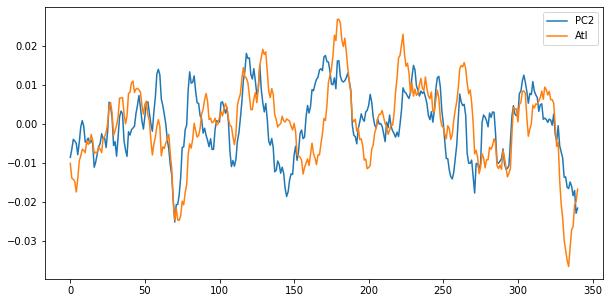

In [357]:
figure(figsize=(10,5))
plt.plot(pca[:,1] * -oht_std[1], label='PC2')
plt.plot(oht_filt["Atlantic"], label='Atl')
plt.legend()

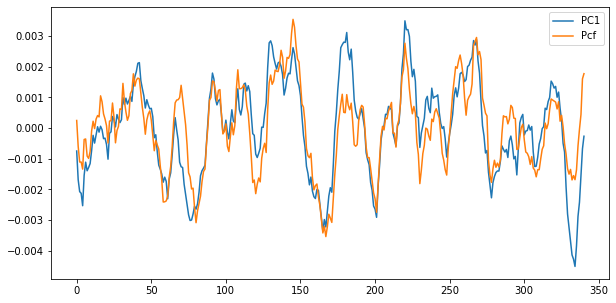

In [356]:
figure(figsize=(10,5))
plt.plot(pca[:,0] * -oht_std[0], label='PC1')
plt.plot(oht_filt["Pacific"], label='Pcf')
plt.legend()

(0.3206440600311448, 1.3605338299319373e-09)


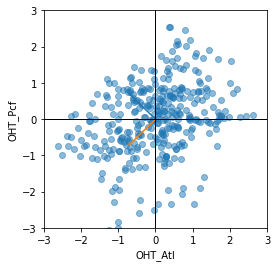

In [224]:
figure(figsize=(4,4))
#plt.scatter(pca[:,0], pca[:,1], alpha=0.2)
plt.scatter(scaled_array[:,0], scaled_array[:,1], alpha=0.5)

print(stats.pearsonr(scaled_array[:,0], scaled_array[:,1]))

comps = model.components_
plt.plot([0, comps[0,0]], [0, comps[1,0]])
plt.plot([0, comps[0,1]], [0, comps[1,1]])

plt.xlabel('OHT_Atl')
plt.ylabel('OHT_Pcf')

plt.xlim(-3,3)
plt.ylim(-3,3)

plt.axhline(color='k', linewidth=1)
plt.axvline(color='k', linewidth=1)


-0.48752676365916814


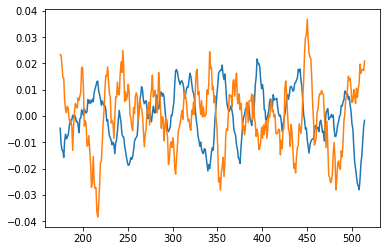

In [340]:
plt.plot(t, oht_pca_comp["Atlantic"][:,0] + oht_pca_comp["Pacific"][:,0])
plt.plot(t, aht_terms_filt["Total"]/1e15)

print(stats.pearsonr(oht_pca_comp["Atlantic"][:,0] + oht_pca_comp["Pacific"][:,0], aht_terms_filt["Total"])[0])

$$A(t) = aC(t) + A'(t)$$
$$B(t) = bC(t) + B'(t)$$
$$C(t) = A(t) + B(t)$$

a = 0.05255325559504538, b = 0.9474467444049492
a + b = 0.9999999999999947


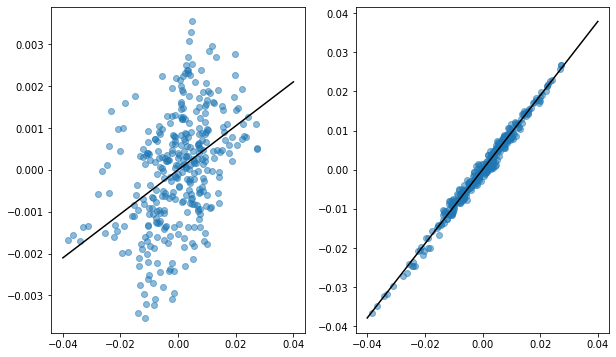

In [ ]:
regr_pcf = linear_model.LinearRegression().fit(oht_filt['Total'].reshape(-1,1), oht_filt['Pacific'])
coef_pcf = regr_pcf.coef_[0]

regr_atl = linear_model.LinearRegression().fit(oht_filt['Total'].reshape(-1,1), oht_filt['Atlantic'])
coef_atl = regr_atl.coef_[0]

print(f'a = {coef_pcf}, b = {coef_atl}')
print(f'a + b = {coef_pcf + coef_atl}')

x = np.linspace(-0.04,0.04,2)

figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.scatter(oht_filt['Total'], oht_filt['Pacific'], alpha=0.5)
plt.plot(x, coef_pcf*x, color='k')

plt.subplot(1,2,2)
plt.scatter(oht_filt['Total'], oht_filt['Atlantic'], alpha=0.5)
plt.plot(x, coef_atl*x, color='k')


In [ ]:
oht_cov_pcf = coef_pcf * oht_filt['Total']
oht_cov_atl = coef_atl * oht_filt['Total']

oht_pcfp = oht_filt['Pacific'] - oht_cov_pcf
oht_atlp = oht_filt['Atlantic'] - oht_cov_atl

print(f'r = {stats.pearsonr(oht_pcfp, oht_atlp)[0]}')


r = -1.0


### Discussion


## Additional figures for AHT and OHT

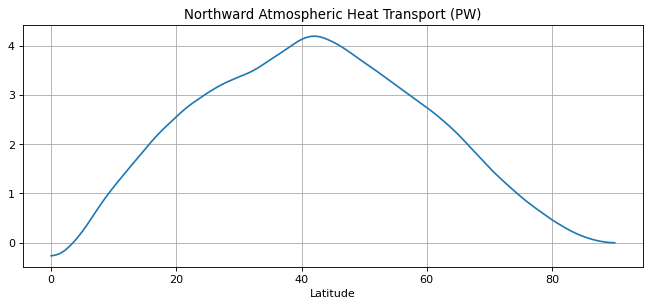

In [17]:
# get lat lon grid 
aht = np.load("data/AHT_new.npy")

lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]
area = getData("FLNT", atmdir, 1, getDataset=True).variables["area"] # solid angle subtended by gridcell

nlat = lat.size
nlon = lon.size

# plot the average for the first nine years
figure(figsize=(10,4), dpi=80)
plt.plot(lat[128:], np.mean(aht[0:108,:], axis=0)/1e15)
plt.title("Northward Atmospheric Heat Transport (PW)")
plt.xlabel("Latitude")
plt.grid(True)

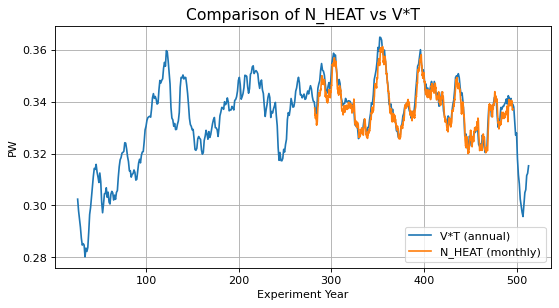

In [65]:
# compare N_HEAT vs V*T calculation
figure(figsize=(8, 4), dpi=80)
plt.plot(years, oht_ann_movmean, label = "V*T (annual)")
plt.plot(years2, oht_mon_movmean, label = "N_HEAT (monthly)")
plt.title("Comparison of N_HEAT vs V*T", fontsize=14)
plt.ylabel("PW")
plt.xlabel("Experiment Year")
plt.legend()
plt.grid(True)

#plt.savefig("figures/OHT_ann_mon_comparison.svg")

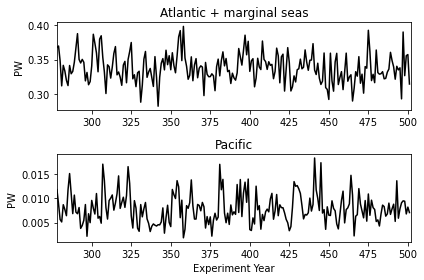

In [226]:
N_HEAT = xr.open_dataset(ocndir+"N_HEAT/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.N_HEAT.027801.050112.nc").variables['N_HEAT']

oht_global = N_HEAT[:,0,0,347].to_numpy()
oht_atl = N_HEAT[:,1,0,347].to_numpy()

oht_ann_global = np.mean(oht_global.reshape(-1, 12), axis=1)
oht_ann_atl = np.mean(oht_atl.reshape(-1, 12), axis=1)

years = np.arange(278,502,1)

plt.subplot(2,1,1)
plt.title("Atlantic + marginal seas")
plt.plot(years, oht_ann_atl, color="k")
plt.xlim(278,502)
plt.ylabel("PW")

plt.subplot(2,1,2)
plt.title("Pacific")
plt.plot(years, oht_ann_global-oht_ann_atl, color="k")
plt.xlim(278,502)
plt.xlabel("Experiment Year")
plt.ylabel("PW")

plt.tight_layout()

plt.savefig("figures/OHT_65N_variability_decomp.svg")

Most of the OHT at 65 deg N occurs in the Atlantic basin, as shown above. At 65 deg N, OHT variability in the Atlantic is `O(0.1 PW)` while the Pacific is `O(0.01 PW)`, about one order of magnitude smaller.

# OHC, TOA fluxes, and non-compensation

Here I explore some of the mechanisms and feedbacks behind undercompensation and overcompensation.

The total meridional heat transport $H_{tot}$ needs to be eventually compensated by a change in TOA fluxes or a change in the integrated OHC (energy conservation). 

$$H_{tot} \approx \frac{dOHC}{dt} + \iint{^\uparrow F_{TOA}} dA$$

$$\frac{dOHC}{dt} = OHT - \iint{^\uparrow F_{sfc}} dA = OHT + AHT - \iint{^\uparrow F_{TOA}} dA$$


If we assume our OHT and AHT calculations are accurate then we can infer $\frac{dOHC}{dt}$ by simply subtracting the integrated TOA fluxes from the total heat transport.

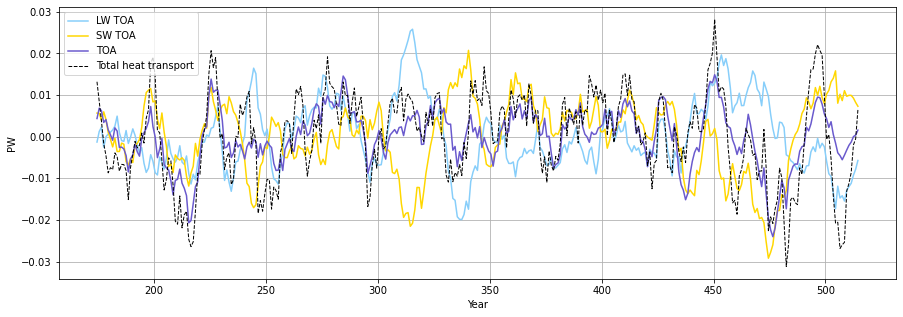

In [40]:
THT = signal.detrend(AHT_ann_movmean[:,65]) + signal.detrend(OHT_ann_movmean)

t = np.linspace(174.5,514.5,341)

figure(figsize=(15,5))

toa_fluxes = {
    "LW TOA": aht_terms_filt["LW TOA"]/1e15,
    "SW TOA": aht_terms_filt["SW TOA"]/1e15,
    "TOA": aht_terms_filt["LW TOA"]/1e15 + aht_terms_filt["SW TOA"]/1e15
}

for term in toa_fluxes:
    plt.plot(t, toa_fluxes[term], label=term, color=colors[term])
    plt.legend()

plt.plot(t, THT, label="Total heat transport", color='k', linewidth=1, linestyle='dashed')
plt.grid(True)
plt.xlabel("Year")
plt.ylabel("PW")
plt.legend()

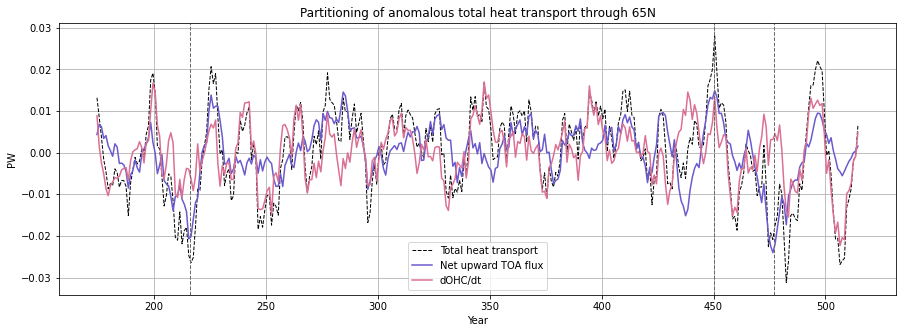

In [41]:
toa_fluxes = {
    "LW TOA": aht_terms_filt["LW TOA"]/1e15,
    "SW TOA": aht_terms_filt["SW TOA"]/1e15,
    "TOA": aht_terms_filt["LW TOA"]/1e15 + aht_terms_filt["SW TOA"]/1e15
}

THT = signal.detrend(AHT_ann_movmean[:,65]) + signal.detrend(OHT_ann_movmean)
dOHCdt = THT - toa_fluxes["TOA"]
ohc = np.cumsum(dOHCdt*(3600*24*365.25))

t = np.linspace(174.5,514.5,341)

figure(figsize=(15,5))

plt.plot(t, THT, label="Total heat transport", color='k', linewidth=1, linestyle='dashed')
plt.plot(t, toa_fluxes["TOA"], color=colors["TOA"], label='Net upward TOA flux')
plt.plot(t, dOHCdt, label="dOHC/dt", color=colors["OHC"])
plt.title("Partitioning of anomalous total heat transport through 65N")

plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')

plt.grid(True)
plt.xlabel("Year")
plt.ylabel("PW")
plt.legend()

Text(0.5, 0, 'Year')

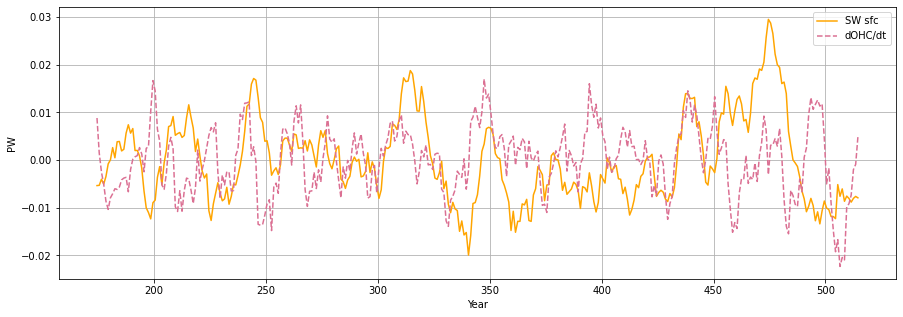

In [371]:
t = np.linspace(174.5,514.5,341)
oht = signal.detrend(oht_ann_movmean)

figure(figsize=(15,5))

plt.plot(t, aht_terms_filt["SW sfc"]/1e15, color=colors['SW sfc'], label='SW sfc')
plt.plot(t, dOHCdt, linestyle='dashed', color=colors['OHC'], label='dOHC/dt')
plt.legend()
plt.grid(True)
plt.ylabel('PW')
plt.xlabel('Year')

In [373]:
stats.pearsonr(oht, dOHCdt)
stats.pearsonr(aht_terms_filt["SW sfc"]/1e15, dOHCdt)

(0.05306450404287329, 0.32857440912663166)

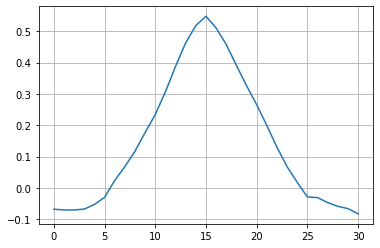

In [43]:
plt.plot(laggedCorr(oht, dOHCdt, 15))
plt.grid(True)

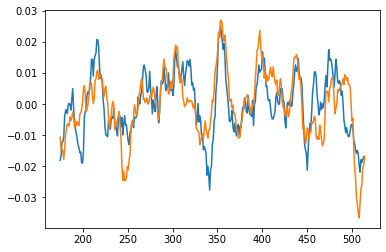

In [44]:
# integrated upward turbulent heat flux 
turb = -aht_terms_filt["Turbulent"]/1e15

plt.plot(t, turb, label='Integrated turbulent heat flux')
plt.plot(t, oht, label='OHT')

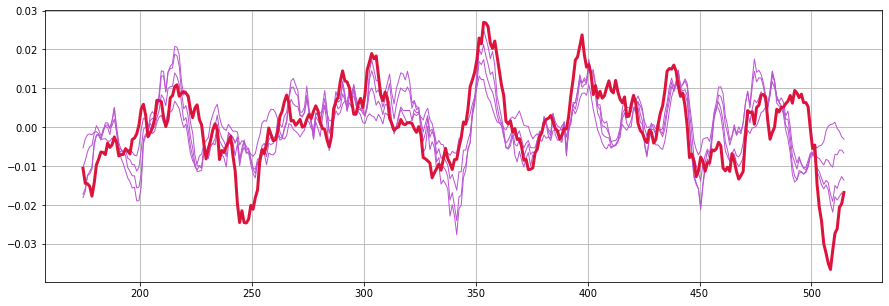

In [45]:
thflx_N = -signal.detrend(running_mean(aht_terms["Turbulent"][:,93:113:5], 10), axis=0)/1e15

figure(figsize=(15,5))
plt.plot(t, thflx_N, label='Integrated turbulent heat flux', color=colors["Turbulent"], linewidth=1)
plt.plot(t, oht, label='OHT', linewidth=3, color=colors['OHT'])
plt.grid(True)
#plt.legend()

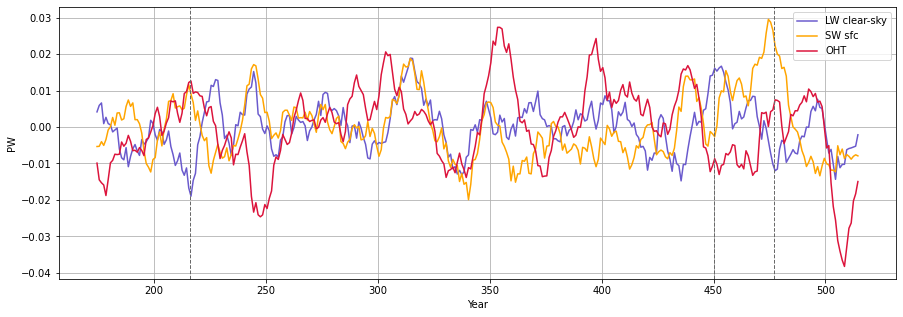

In [46]:
# get the full (annual mean) OHT timeseries at 65 deg N
OHT_ann = xr.open_dataset(ocndir + "vTFlux_65N_Global.nc").variables['vTFlux_65N_Global'][169:]
OHT_ann_movmean = running_mean(OHT_ann, 10)

oht = signal.detrend(OHT_ann_movmean)

t = np.linspace(174.5,514.5,341)

figure(figsize=(15,5))

plt.plot(t,aht_terms_filt["LW clear-sky"]/1e15, label="LW clear-sky", color=colors["LW clear-sky"])
plt.plot(t,aht_terms_filt["SW sfc"]/1e15, label="SW sfc", color=colors['SW sfc'])
plt.plot(t,oht, label='OHT', color=colors['OHT'])

plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')

plt.grid(True)
plt.xlabel("Year")
plt.ylabel("PW")
plt.legend()

above: shows the integrated longwave (clear-sky) and surface shortwave radiation going *out* of the atmosphere. Year 200: positive OHT and turbulent heat flux anomaly coupled with a strong longwave anomaly going into the atmosphere (hence an overcompensation in the reduced AHT). Concurrently, there is a positive surface shortwave anomaly (more shortwave leaving the atmosphere and entering the ocean). I presume this may be related to a particularly strong loss in sea ice. 



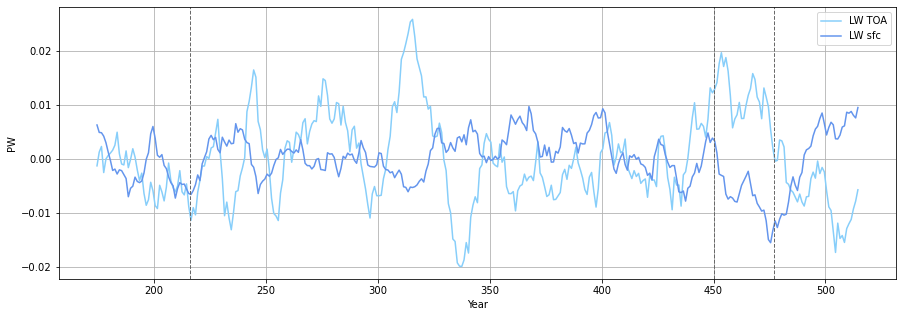

In [47]:
t = np.linspace(174.5,514.5,341)

figure(figsize=(15,5))

plt.plot(t,aht_terms_filt["LW TOA"]/1e15, label="LW TOA", color=colors["LW TOA"])
plt.plot(t,aht_terms_filt["LW sfc"]/1e15, label="LW sfc", color=colors['LW sfc'])
plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')

plt.grid(True)
plt.xlabel("Year")
plt.ylabel("PW")
plt.legend()


the TOA and sfc longwave roughly compensate (meaning usually the LW from the surface warms/cools the atmosphere and generates a same-sign response at the TOA). But, sometimes they are the same sign (**Why?**)

## Relationship with sea ice

Timeseries for sea ice area ($km^2$) are calculated. `siatl` and `sipcf` refer to the timeseries for different halves of the Arctic, roughly corresponding to the Atlantic and Pacific sectors respectively. The sectors chosen are shown below:

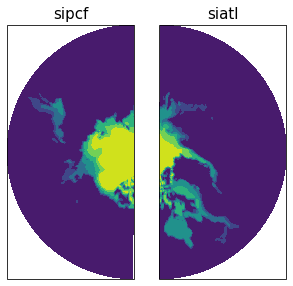

In [50]:
mlon = np.roll(lon, 0)

fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.NorthPolarStereo()},
                        figsize=(5,5))

axs[0].contourf(mlon[256:], lat[60:], siconc[0,60:,256:], transform=ccrs.PlateCarree())
axs[0].set_title("sipcf", fontsize=15)
axs[1].contourf(mlon[0:256], lat[60:], siconc[0,60:,0:256], transform=ccrs.PlateCarree())
axs[1].set_title("siatl", fontsize=15)
fig.show()

In [30]:
print(lon)
mlon = np.roll(lon, 140)
print(mlon[256])

<xarray.IndexVariable 'lon' (lon: 512)>
array([  0.      ,   0.703125,   1.40625 , ..., 357.890625, 358.59375 ,
       359.296875])
Attributes:
    long_name:      Longitude of Grid Cell Centers
    standard_name:  longitude
    units:          degrees_east
    axis:           X
    valid_min:      0.0
    valid_max:      360.0
    bounds:         lon_bnds
81.5625


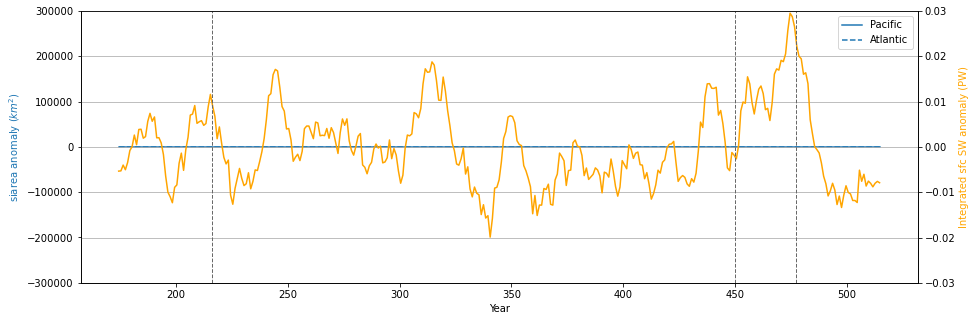

In [58]:
# sea ice concentration (0 to 1)
siconc = np.load("data/icefrac_ann.npy")
siconc_movmean = signal.detrend(running_mean(siconc, 10), axis=0)

# shift the discontinuity out of the atlantic
siconc = np.roll(siconc, 140, axis=2)

# calculate timeseries of sea ice area for two "halves" of the Arctic (units = km^2)
siatl = np.sum(siconc[:,:,0:256] * area[128:,0:256] * a**2, axis=(1,2))/1e6
sipcf = np.sum(siconc[:,:,256:] * area[128:,256:] * a**2, axis=(1,2))/1e6

siatl_movmean = signal.detrend(running_mean(siatl, 10))
sipcf_movmean = signal.detrend(running_mean(sipcf, 10))
siall_movmean = signal.detrend(running_mean(siatl + sipcf, 10))

fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()

ax1.plot(t, sipcf_movmean, color="tab:blue", label='Pacific')
ax1.plot(t, siatl_movmean, color='tab:blue', linestyle='dashed', label='Atlantic')
ax2.plot(t,aht_terms_filt["SW sfc"]/1e15, label="SW sfc", color=colors['SW sfc'])

ax1.set_xlabel('Year')
ax1.set_ylabel('siarea anomaly ($km^2$)', color='tab:blue')
ax1.set_ylim([-3e5,3e5])
ax2.set_ylabel('Integrated sfc SW anomaly (PW)', color=colors['SW sfc'])
ax2.set_ylim([-0.03, 0.03])

plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')

ax1.legend()
plt.grid(True)


<a id='sw-si'></a>**Above**: the anticorrelation between sfc shortwave anomaly (SW leaving the atmosphere) and sea ice area. Seems closest for the Pacific sector... 

### Sea ice and OHT timeseries

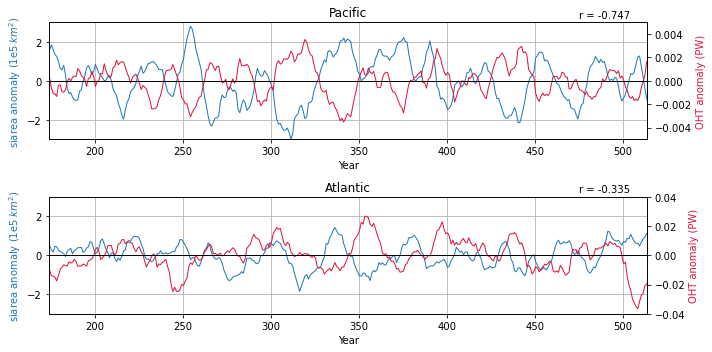

In [45]:
# sea ice concentration (0 to 1)
siconc = np.load("data/icefrac_ann.npy")
siconc_movmean = signal.detrend(running_mean(siconc, 10), axis=0)

# shift the discontinuity out of the atlantic
siconc = np.roll(siconc, 140, axis=2)

# calculate timeseries of sea ice area for two "halves" of the Arctic (units = km^2)
siatl = np.sum(siconc[:,:,0:256] * area[128:,0:256] * a**2, axis=(1,2))/1e6
sipcf = np.sum(siconc[:,:,256:] * area[128:,256:] * a**2, axis=(1,2))/1e6

si_filt = {
    "Atlantic": signal.detrend(running_mean(siatl, 10))/1e5,
    "Pacific": signal.detrend(running_mean(sipcf, 10))/1e5,
    "Total": signal.detrend(running_mean(siatl + sipcf, 10))/1e5
}

ylims = {
    "Atlantic": [-0.04, 0.04],
    "Pacific": [-0.005, 0.005]
}

fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10,5))

axs = axs.flatten()

for i,sect in enumerate(["Pacific", "Atlantic"]):
    ax2 = axs[i].twinx()
    axs[i].plot(t, si_filt[sect], color="tab:blue", label=sect, linewidth=1)
    ax2.plot(t, oht_filt[sect], color=colors["OHT"], linewidth=1)

    axs[i].set_xlabel('Year')
    axs[i].set_ylabel('siarea anomaly (1e5 $km^2$)', color='tab:blue')
    axs[i].set_ylim([-3, 3])
    axs[i].set_title(sect)
    ax2.set_ylabel('OHT anomaly (PW)', color=colors['OHT'])
    ax2.set_ylim(ylims[sect])
    
    plt.xlim([174,514])
    plt.axhline(color='k', linewidth=1)

    axs[i].grid(True)
    r = np.round(stats.pearsonr(oht_filt[sect], si_filt[sect])[0], 3)
    plt.text(475, ylims[sect][1]*1.08, f'r = {r}')
    
fig.tight_layout()

fig.savefig("figures/si_OHT.svg", bbox)

Even though it is only on the order of 0.001 PW, the OHT variability through the Bering strait seems very important for modulating the sea ice response. Anticorrelation of $r=-0.747$. 

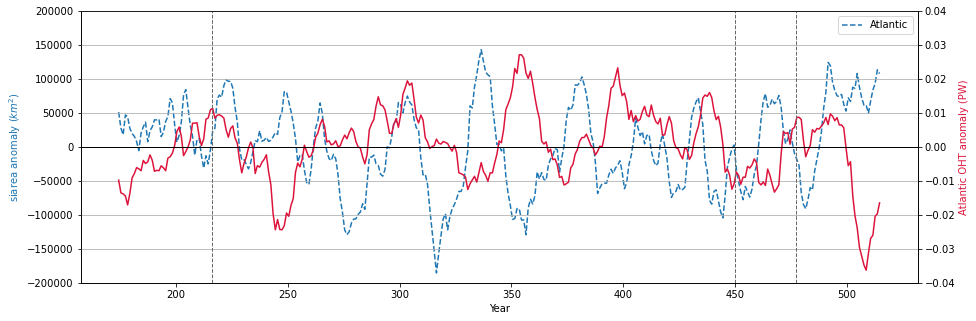

In [159]:
fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()

#ax1.plot(t, sipcf_movmean, color="tab:blue", label='Atlantic')
ax1.plot(t, siatl_movmean, color='tab:blue', linestyle='dashed', label='Atlantic')
#ax2.plot(t, oht, label="OHT", color=colors['OHT'])
ax2.plot(t, running_mean(signal.detrend(oht_comp["Global"] - oht_comp["Bering"]), 10), color=colors["OHT"])

ax1.set_xlabel('Year')
ax1.set_ylabel('siarea anomaly ($km^2$)', color='tab:blue')
ax1.set_ylim([-2e5,2e5])
ax2.set_ylabel('Atlantic OHT anomaly (PW)', color=colors['OHT'])
ax2.set_ylim([-0.04, 0.04])

plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axhline(color='k', linewidth=1)


ax1.legend()
plt.grid(True)

-0.3218914632311838


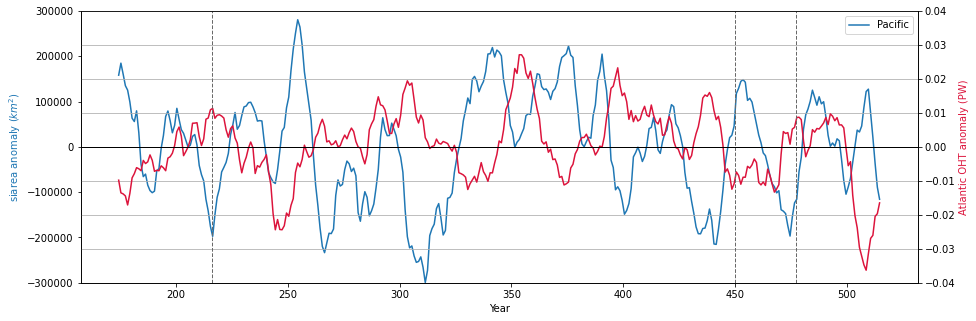

In [172]:
fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()

oht_atl = running_mean(signal.detrend(oht_comp["Global"] - oht_comp["Bering"]), 10)

ax1.plot(t, sipcf_movmean, color="tab:blue", label='Pacific')
#ax1.plot(t, siatl_movmean, color='tab:blue', linestyle='dashed', label='Atlantic')
#ax2.plot(t, oht, label="OHT", color=colors['OHT'])
ax2.plot(t, oht_atl, color=colors["OHT"])

ax1.set_xlabel('Year')
ax1.set_ylabel('siarea anomaly ($km^2$)', color='tab:blue')
ax1.set_ylim([-3e5,3e5])
ax2.set_ylabel('Atlantic OHT anomaly (PW)', color=colors['OHT'])
ax2.set_ylim([-0.04, 0.04])

plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axhline(color='k', linewidth=1)


ax1.legend()
plt.grid(True)

print(stats.pearsonr(sipcf_movmean, oht_atl)[0])

0.3206475377026482


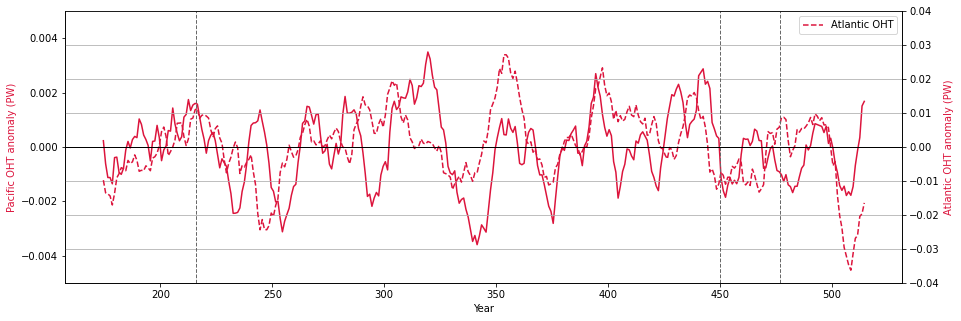

In [178]:
fig, ax1 = plt.subplots(figsize=(15,5))
ax2 = ax1.twinx()

oht_pcf = running_mean(signal.detrend(oht_comp["Bering"]), 10)
ax1.plot(t, oht_pcf, color=colors['OHT'], label='Pacific OHT')
#ax1.plot(t, siatl_movmean, color='tab:blue', linestyle='dashed', label='Atlantic')
#ax2.plot(t, oht, label="OHT", color=colors['OHT'])
ax2.plot(t, oht_atl, color=colors["OHT"], linestyle='dashed', label='Atlantic OHT')

ax1.set_xlabel('Year')
ax1.set_ylabel('Pacific OHT anomaly (PW)', color=colors['OHT'])
ax1.set_ylim([-0.005, 0.005])
ax2.set_ylabel('Atlantic OHT anomaly (PW)', color=colors['OHT'])
ax2.set_ylim([-0.04, 0.04])

plt.axvline(x=216, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=450, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axvline(x=477, color='dimgrey', linewidth=1, linestyle='dashed')
plt.axhline(color='k', linewidth=1)


plt.legend()
plt.grid(True)

print(stats.pearsonr(oht_pcf, oht_atl)[0])

In [52]:
flux_anom_maps = {}

for term in flux_terms:
    flux_anom_maps[term] = signal.detrend(running_mean(flux_terms[term], 10), axis=0)



0.4368416343298279


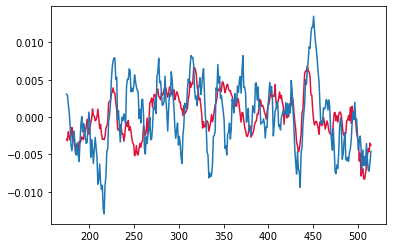

In [265]:
term = "LW"
r = stats.pearsonr(running_mean(signal.detrend(oht_comp["Davis"]), 10), aht_sector_terms_filt[term]["Atlantic"])[0]
print(r)

plt.plot(t, running_mean(signal.detrend(oht_comp["Davis"]), 10), color=colors["OHT"])
plt.plot(t, aht_sector_terms_filt[term]["Atlantic"])

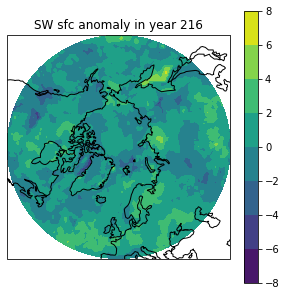

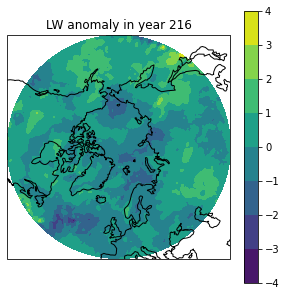

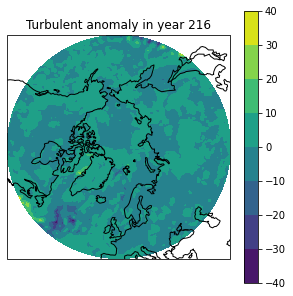

In [64]:
terms = ["SW sfc", "LW", "Turbulent"]

for i,term in enumerate(terms):
    fig, axs = plt.subplots(nrows=1,ncols=1,
                            subplot_kw={'projection': ccrs.NorthPolarStereo()},
                            figsize=(5,5))

    cf = axs.contourf(lon, lat[60:], flux_anom_maps[term][46,60:,:], transform=ccrs.PlateCarree())
    axs.coastlines()
    axs.set_title(term + " anomaly in year 216")
    fig.colorbar(cf)



A quick summary of observations (8/8/22):
- Sometimes, the magnitude of the AHT anomaly is significantly greater than the magnitude of the OHT anomaly (e.g., EY 216, 450, 477). This seems to be caused by longwave radiative feedbacks that amplify the typical turbulent heat flux. 
- **Proposed mechanism**: 
    1) sea-ice melt causes an increase in surface shortwave absorption. We do see this occuring in EY 216 and 477, but not 450 (see [this figure](#sw-si)). Note that most of this response is seen in the Pacific sector only
    2) relatively warm surface ocean releases extra LW radiation and turbulent heat fluxes into atmosphere. 
        - The LW signal is actually dominated by the *decrease* in TOA LW loss, rather than the increase in sfc LW gain, which is counterintuitive and does not readily support the hypothesis that this radiative effect is sea ice-mediated
        
Other thoughts/questions
- what is causing the variability in the radiative fluxes, particularly LW? seems not very well correlated with the THF. Can it also be an imprint of some other atmospheric variability?
- the flux response in the Pacific sector is usually weak but it seems that during the periods of overcompensation it plays an important secondary role in amplifying the Atlantic flux response. 
- The integrated LW anomaly in the Pacific sector is positively correlated with the Bering Strait OHT (meaning more OHT -> more heat loss to space through TOA; hence LW response dampens the BJC), but the integrated LW anomaly in the Atlantic sector is anticorrelated with the Atlantic OHT. Why?
- The Bering Strait heat transport seems very important in modulating the Pacific sector sea ice. Even though the Bering Strait OHT variability is one order of magnitude smaller than the Atlantic OHT variability, it may have an outsized importance in modulating the surface fluxes due to the strong sea-ice response

# Sea ice regressions
(7/19) We expect the greatest compensation to occur at the sea ice margin. This is where anomalous OHT generates the greatest response in AHT via modulation of the sea ice layer. Since there is little to no BJC, we first diagnose the sea ice correlation with OHT to see to what extent OHT modulates the ice cover. 

The sea ice fraction is stored in the `ICEFRAC` variable. I retrieve only the northern hemisphere, hence the (128,257) bounds on the latitude. All fields in this section should start from latitude index 128. 

In [227]:
icefrac = getData("ICEFRAC", atmdir, "all", [128,257])

In [228]:
# get annual mean
icefrac_ann = np.mean(icefrac.reshape(-1, 12, 129, 512), axis=1)

# detrend and take moving mean 
icefrac_ann_movmean = signal.detrend(running_mean(icefrac_ann, 10), axis=0)
nt, nlat, nlon = icefrac_ann_movmean.shape

np.save("data/icefrac_ann", icefrac_ann)

## Climatology and variability 
(7/21) The HR configuration of CESM1.3 as seen here is known to consistently underestimate sea ice extent (https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2020MS002298). 

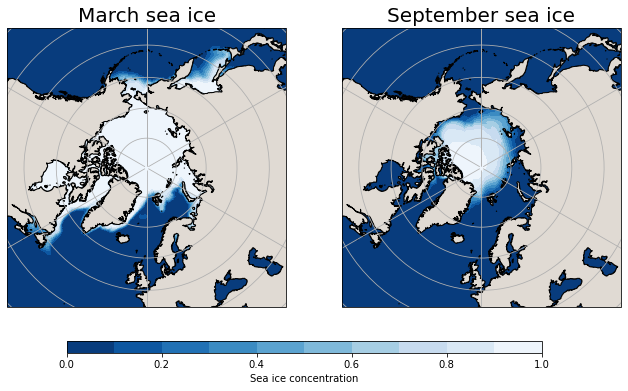

In [218]:
#get sea ice for seasons 
icefrac_mar = np.mean(icefrac.reshape(-1,12,nlat,nlon)[:,2,:,:], axis=0)
icefrac_sep = np.mean(icefrac.reshape(-1,12,nlat,nlon)[:,8,:,:], axis=0)

# plot seasonal sea ice climatology 

# get lat lon grid
lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"][128:]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]

fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.NorthPolarStereo()},
                        figsize=(11,8.5))

tan = (224/255, 218/255, 211/255)

axs[0].contourf(lon, lat, icefrac_mar, np.arange(0,1.1,0.1), cmap='Blues_r', transform=ccrs.PlateCarree())
axs[0].set_title("March sea ice", fontsize=20)
axs[0].coastlines()
axs[0].set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
axs[0].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=tan))
axs[0].gridlines()

cs = axs[1].contourf(lon, lat, icefrac_sep, np.arange(0,1.1,0.1), cmap='Blues_r', transform=ccrs.PlateCarree())
axs[1].set_title("September sea ice", fontsize=20)
axs[1].coastlines()
axs[1].set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
axs[1].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=tan))
axs[1].gridlines()

cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])
cbar = fig.colorbar(cs, cax=cbar_ax, fraction=0.046, pad=0.04, orientation="horizontal")
cbar.set_label("Sea ice concentration")

#fig.savefig("figures/si_climatology.svg")

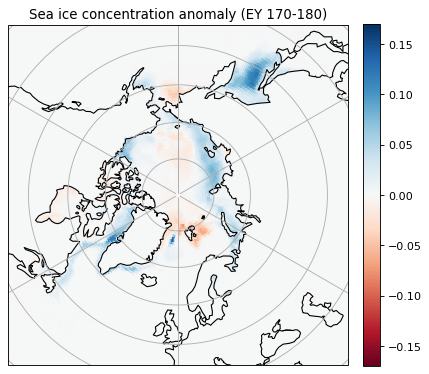

In [250]:
# get lat lon grid
lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"][128:]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]

figure(figsize=(6,6), dpi=80)

ax = plt.axes(projection=ccrs.NorthPolarStereo())

plt.pcolormesh(lon, lat, icefrac_ann_movmean[0,:,:], cmap='RdBu', transform=ccrs.PlateCarree())
plt.title("Sea ice concentration anomaly (EY 170-180)")
ax.coastlines()
ax.set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
ax.gridlines()
plt.clim(-0.17,0.17)
plt.colorbar(fraction=0.046, pad=0.04)


In [19]:
# get the full (annual mean) OHT timeseries at 65 deg N
oht_comp = {
    "Global": xr.open_dataset(ocndir + "vTFlux_65N_Global.nc").variables['vTFlux_65N_Global'][169:],
    "GSR": xr.open_dataset(ocndir + "vTFlux_65N_GSR.nc").variables['vTFlux_65N_GSR'][169:],
    "Bering": xr.open_dataset(ocndir + "vTFlux_65N_Bering.nc").variables['vTFlux_65N_Bering'][169:],
    "Davis": xr.open_dataset(ocndir + "vTFlux_65N_Davis.nc").variables['vTFlux_65N_Davis'][169:]
}

oht_comp["Residual"] = oht_comp["Global"]-oht_comp["GSR"]-oht_comp["Bering"]-oht_comp["Davis"]

oht_filt = {}

oht_filt["Pacific"] = signal.detrend(running_mean(oht_comp["Bering"], 10))
oht_filt["Atlantic"] = signal.detrend(running_mean(oht_comp["Global"] - oht_comp["Bering"], 10))
oht_filt["Total"] = signal.detrend(running_mean(oht_comp["Global"], 10))

icefrac_ann_movmean = signal.detrend(running_mean(np.load('data/icefrac_ann.npy'), 10), axis=0)

# normalize the OHT timeseries
oht_norm = signal.detrend(oht_filt["Total"]/oht_filt["Total"].std())

oht_sic_reg = regress_spatial(icefrac_ann_movmean, oht_norm) 
np.save('data/oht_sic_reg', oht_sic_reg)

## Regressions onto OHT

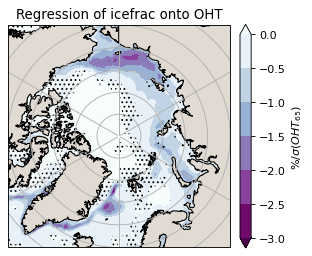

In [24]:
oht_sic_reg_rmp = oht_sic_reg[:,:,0].copy()
oht_sic_reg_rmp[oht_sic_reg[:,:,1]<0.05] = np.nan

# plot the regression map
lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"][128:]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]

figure(figsize=(4,4), dpi=80)

tan = (224/255, 218/255, 211/255)

ax = plt.axes(projection=ccrs.NorthPolarStereo())

cs = plt.contourf(lon, lat, oht_sic_reg[:,:,0]*100, np.arange(-3,.1,.5), 
             extend='both', cmap='BuPu_r', transform=ccrs.PlateCarree())
plt.contourf(lon, lat, (oht_sic_reg_rmp[:,:]), 
                colors='None', hatches=['.'*3], transform=ccrs.PlateCarree())
plt.title("Regression of icefrac onto OHT", fontsize=12)
ax.gridlines()
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=tan))
ax.set_extent([-180, 180, 90, 65], ccrs.PlateCarree())
cbar = plt.colorbar(cs, fraction=0.046, pad=0.04)
cbar.set_label("$\%/\sigma(OHT_{65})$")
plt.tight_layout()

plt.savefig("figures/total_regress/OHT_si_regress.svg", bbox_inches='tight')
plt.savefig("figures/total_regress/OHT_si_regress.png", bbox_inches='tight')

In [168]:
oht_comp_norm = {}
oht_comp_sic_reg = {}

icefrac_ann_movmean = signal.detrend(running_mean(np.load("data/icefrac_ann.npy"), 10))

for term in oht_comp.keys():
    oht_movmean = running_mean(oht_comp[term],10)
    oht_comp_norm[term] = signal.detrend(oht_movmean/oht_movmean.std(ddof=1))
    
    oht_comp_sic_reg[term] = regress_spatial(icefrac_ann_movmean, oht_comp_norm[term]) 

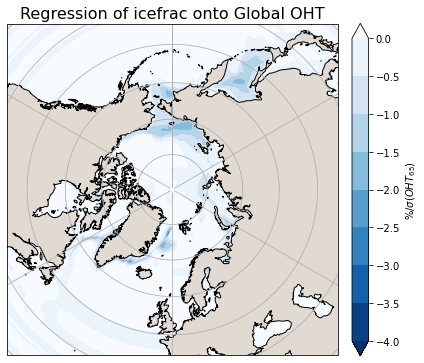

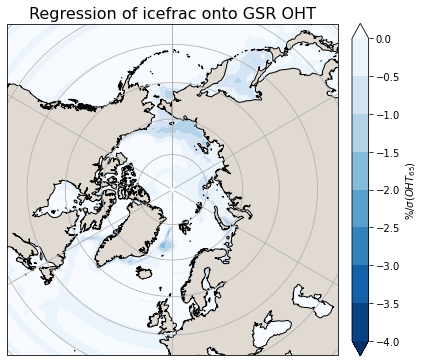

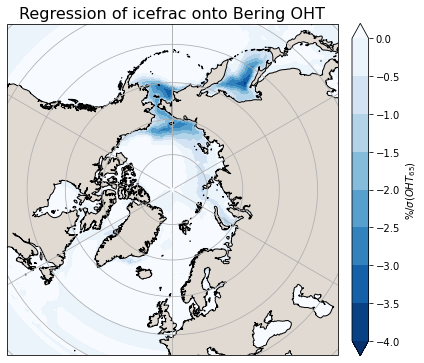

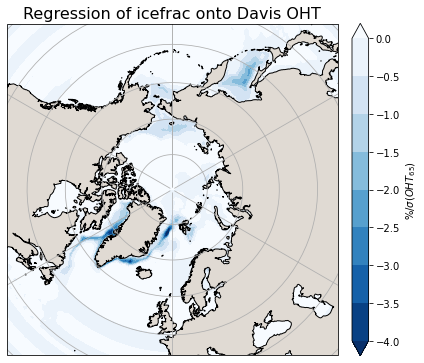

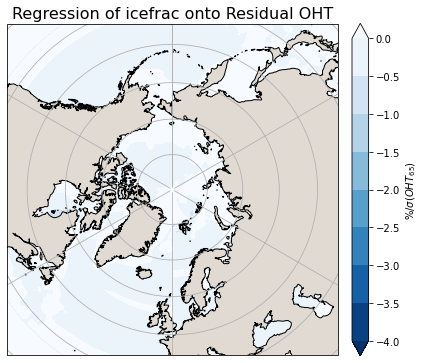

In [181]:
tan = (224/255, 218/255, 211/255)

for term in oht_comp_sic_reg.keys():
    oht_sic_reg_rmp = oht_comp_sic_reg[term][:,:,0].copy()
    oht_sic_reg_rmp[oht_comp_sic_reg[term][:,:,1]<0.05] = np.nan

    plt.figure(figsize=(6,6))

    ax = plt.axes(projection=ccrs.NorthPolarStereo())

    cs = plt.contourf(lon, lat, oht_comp_sic_reg[term][:,:,0]*100, np.arange(-4,.1,.5), 
                 extend='both', cmap='Blues_r', transform=ccrs.PlateCarree())
    #plt.contourf(lon, lat, (oht_sic_reg_rmp[:,:]), 
    #                colors='None', hatches=['.'*3], transform=ccrs.PlateCarree())
    plt.title(f"Regression of icefrac onto {term} OHT", fontsize=16)
    ax.gridlines()
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=tan))
    ax.set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
    cbar = plt.colorbar(cs, fraction=0.046, pad=0.04)
    cbar.set_label("$\%/\sigma(OHT_{65})$")
    plt.tight_layout()


In [254]:
shflx = getData("SHFLX", atmdir, "all", [128,257])
lhflx = getData("LHFLX", atmdir, "all", [128,257])

# get snowfall rate 
precsc = getData("PRECSC", atmdir, "all", [128,257])
precsl = getData("PRECSL", atmdir, "all", [128,257]) 

# calculate the latent heat flux due to snowfall
# rho_w * L_w * (snow rate)
# positive is up
hflxsnow = 1000 * 334000 * (precsl+precsc)

In [76]:
shflx = np.load("data/SHFLX_mon.npy")
lhflx = np.load("data/LHFLX_mon.npy")
hflxsnow = np.load("data/HFLXSNOW_mon.npy")

nt, nlat, nlon = shflx.shape

In [77]:
# get the full (annual mean) OHT timeseries at 65 deg N
oht_ann = xr.open_dataset(ocndir + "vTFlux_65N.nc").variables['vTFlux_65N'][169:]
oht_ann_movmean = running_mean(oht_ann, 10)

# normalize the OHT timeseries
oht_norm = signal.detrend(oht_ann_movmean[:]/oht_ann_movmean[:].std(ddof = 1))

# sensible heat flux
shflx_ann = np.mean(shflx.reshape(-1,12,nlat,nlon), axis=1)
shflx_ann_movmean = signal.detrend(running_mean(shflx_ann, 10), axis=0)

# latent heat flux
lhflx_tot = lhflx + hflxsnow
lhflx_ann = np.mean(lhflx_tot.reshape(-1,12,nlat,nlon), axis=1)
lhflx_ann_movmean = signal.detrend(running_mean(lhflx_ann, 10), axis=0)

# turbulent heat flux
thflx = shflx + lhflx + hflxsnow
thflx_ann = np.mean(thflx.reshape(-1,12,nlat,nlon), axis=1)
thflx_ann_movmean = signal.detrend(running_mean(thflx_ann, 10), axis=0)

terms = [shflx_ann_movmean, lhflx_ann_movmean, thflx_ann_movmean]
key = ["Sensible heat flux", "Latent heat flux", "Turbulent heat flux"]
oht_hflx_reg = []

# regress each term onto normalized OHT
for term in terms:
    oht_hflx_reg.append(regress_spatial(term, oht_norm))

np.save("data/oht_hflx_reg", oht_hflx_reg)

(129, 512, 2)


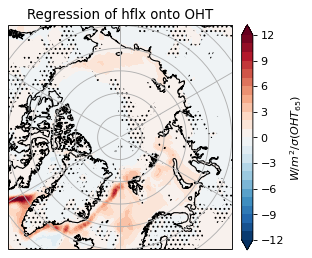

In [25]:
oht_hfx_reg = np.load("data/oht_hflx_reg.npy")[2,:,:,:]

print(oht_hfx_reg.shape)
oht_hfx_reg_rmp = oht_hfx_reg[:,:,0].copy()
oht_hfx_reg_rmp[oht_hfx_reg[:,:,1]<0.05] = np.nan

# plot the regression map
lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"][128:]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]

figure(figsize=(4,4), dpi=80)

tan = (224/255, 218/255, 211/255)

ax = plt.axes(projection=ccrs.NorthPolarStereo())

cs = plt.contourf(lon, lat, oht_hfx_reg[:,:,0], np.arange(-12,13,1),
             extend='both', cmap='RdBu_r', transform=ccrs.PlateCarree())
plt.contourf(lon, lat, (oht_hfx_reg_rmp[:,:]), 
                colors='none', hatches=['.'*3], transform=ccrs.PlateCarree())
plt.title("Regression of hflx onto OHT", fontsize=12)
ax.gridlines()
ax.coastlines()
#ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=tan))
ax.set_extent([-180, 180, 90, 65], ccrs.PlateCarree())
cbar = plt.colorbar(cs, fraction=0.046, pad=0.04)
cbar.set_label("$W/m^{2}/\sigma(OHT_{65})$") 
plt.tight_layout()

plt.savefig("figures/total_regress/OHT_hflx_regress.svg", bbox_inches='tight')
plt.savefig("figures/total_regress/OHT_hflx_regress.png", bbox_inches='tight')

# Regressions of atmospheric response 
## Liquid and ice water path 
LWP is defined as the vertically integrated condensed water in a column; it has units $kg/m^2$. 

In [48]:
lwp = getData("TGCLDLWP", atmdir, "all", [128,257]) 
iwp = getData("TGCLDIWP", atmdir, "all", [128,257])

lwp_ann = np.mean(lwp.reshape(-1, 12, 129, 512), axis=1)
iwp_ann = np.mean(iwp.reshape(-1, 12, 129, 512), axis=1)

In [192]:
lwp_ann_movmean = signal.detrend(running_mean(lwp_ann, 10), axis=0)
iwp_ann_movmean = signal.detrend(running_mean(iwp_ann, 10), axis=0)

# get the full (annual mean) OHT timeseries at 65 deg N
oht_ann = xr.open_dataset(ocndir + "vTFlux_65N.nc").variables['vTFlux_65N'][169:]
oht_ann_movmean = running_mean(oht_ann, 10)

# normalize the OHT timeseries
oht_norm = signal.detrend(oht_ann_movmean[:]/oht_ann_movmean[:].std(ddof = 1))

# regress using statsmodel (also gets p value for regression slope)
oht_lwp_reg = regress_spatial(lwp_ann_movmean, oht_norm)
oht_iwp_reg = regress_spatial(iwp_ann_movmean, oht_norm)

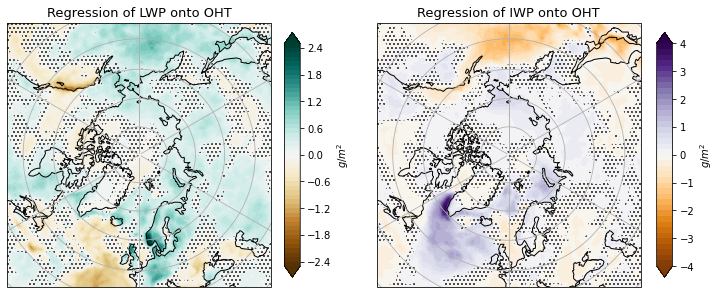

In [389]:
# make duplicates where p values less than 0.05 are removed ("remove p")
oht_lwp_reg_rmp = oht_lwp_reg[:,:,0].copy()
oht_lwp_reg_rmp[oht_lwp_reg[:,:,1]<0.05] = np.nan

oht_iwp_reg_rmp = oht_iwp_reg[:,:,0].copy()
oht_iwp_reg_rmp[oht_iwp_reg[:,:,1]<0.05] = np.nan

# get lat lon grid
lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"][128:]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]

fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.NorthPolarStereo()},
                        figsize=(11,8.5))

tan = (224/255, 218/255, 211/255)

# note: convert LWP and IWP regression to g/m^2 for better readability 
cs0 = axs[0].contourf(lon, lat, oht_lwp_reg[:,:,0]*1000, np.arange(-2.5, 2.6, 0.1), 
                      cmap='BrBG', transform=ccrs.PlateCarree(), extend="both")
axs[0].contourf(lon, lat, (oht_lwp_reg_rmp[:,:]), 
                colors='none', hatches=["."*3], transform=ccrs.PlateCarree())
axs[0].set_title("Regression of LWP onto OHT", fontsize=13)
axs[0].coastlines()
axs[0].set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
axs[0].gridlines()

cs1 = axs[1].contourf(lon, lat, oht_iwp_reg[:,:,0]*1000, np.arange(-4, 4.2, 0.2), 
                      cmap='PuOr', transform=ccrs.PlateCarree(), extend="both")
axs[1].contourf(lon, lat, (oht_iwp_reg_rmp[:,:]), 
                colors='none', hatches=["."*3], transform=ccrs.PlateCarree())
axs[1].set_title("Regression of IWP onto OHT", fontsize=13)
axs[1].coastlines()
axs[1].set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
axs[1].gridlines()

cbar_ax0 = fig.add_axes([0.45, 0.3, 0.02, 0.4])
cbar = fig.colorbar(cs0, cax=cbar_ax0)
cbar.set_label("$g/m^2$")

cbar_ax1 = fig.add_axes([0.92, 0.3, 0.02, 0.4])
cbar = fig.colorbar(cs1, cax=cbar_ax1)
cbar.set_label("$g/m^2$")

fig.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

fig.savefig("figures/OHT_lwp_iwp_regress.svg")

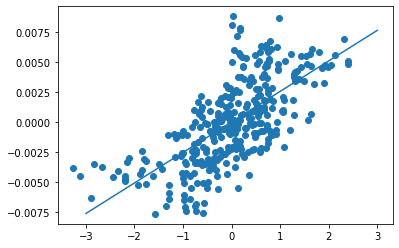

In [141]:

x = np.linspace(-3, 3, 100)
plt.scatter(oht_norm, lwp_ann_movmean[:,85,10])
plt.plot(x, x*coef)

oht_lwp_reg = np.zeros((nlat, nlon, 2))
for i in range(nlat):
    for j in range(nlon):
        fit = sm.OLS(lwp_ann_movmean[:,i,j], oht_norm).fit()
        p = fit.pvalues[0]
        coef = fit.params[0]
        
        oht_lwp_reg[i,j,:] = (coef, p)


## Radiative flux terms

<h3 align="center"> Atmospheric LW budget</h3>

$$F_{TOA,CS} = -F_{LNTC}$$

$$F_{sfc,CS} = F_{LNSC}$$

$$F_{TOA,cloud} = -(F_{LNT} - F_{LNTC})$$

$$F_{sfc,cloud} = F_{LNS} - F_{LNSC}$$

$$F_{tot} = \sum{\left(F_{TOA} + F_{sfc}\right)} = F_{LNS} - F_{LNT} = F_{LUS} - F_{LDS} - F_{LUT}$$


<h3 align="center"> Atmospheric SW budget</h3>

$$F_{TOA,CS} = F_{SNTC}$$

$$F_{sfc,CS} = -F_{SNSC}$$

$$F_{TOA,cloud} = F_{SNT} - F_{SNTC}$$

$$F_{sfc,cloud} = -(F_{SNS} - F_{SNSC})$$

$$F_{tot} = \sum{\left(F_{TOA} + F_{sfc}\right)} = F_{SNT} - F_{SNS}$$


In [342]:
fsntc = getData("FSNTC", atmdir, "all", [128,257])
fsnsc = getData("FSNSC", atmdir, "all", [128,257])
fsnt = getData("FSNT", atmdir, "all", [128,257])
fsns = getData("FSNS", atmdir, "all", [128,257])

fsntc_ann = annmean(fsntc)
fsnsc_ann = annmean(fsnsc)
fsnt_ann = annmean(fsnt)
fsns_ann = annmean(fsns) 

np.save("data/rflx/FSNTC_ann", fsntc_ann)
np.save("data/rflx/FSNSC_ann", fsnsc_ann)
np.save("data/rflx/FSNT_ann", fsnt_ann)
np.save("data/rflx/FSNS_ann", fsns_ann) 

np.save("data/rflx/FSNTC_mon", fsntc)
np.save("data/rflx/FSNSC_mon", fsnsc)
np.save("data/rflx/FSNT_mon", fsnt)
np.save("data/rflx/FSNS_mon", fsns) 

SW_budget_mon = [fsntc, 
             fsnsc,
             fsnt - fsntc, 
             fsns - fsnsc,
             fsns - fsnt]

SW_budget_ann = [fsntc_ann, 
             fsnsc_ann,
             fsnt_ann - fsntc_ann, 
             fsns_ann - fsnsc_ann,
             fsns_ann - fsnt_ann]

np.save("data/rflx/SW_budget_mon", SW_budget_mon)
np.save("data/rflx/SW_budget_ann", SW_budget_ann)

In [340]:
# note: memory intensive. Access saved npy arrays instead
flntc = getData("FLNTC", atmdir, "all", [128,257])
flnsc = getData("FLNSC", atmdir, "all", [128,257])
flnt = getData("FLNT", atmdir, "all", [128,257])
flns = getData("FLNS", atmdir, "all", [128,257])

flntc_ann = annmean(flntc)
flnsc_ann = annmean(flnsc)
flnt_ann = annmean(flnt)
flns_ann = annmean(flns) 

np.save("data/rflx/FLNTC_ann", flntc_ann)
np.save("data/rflx/FLNSC_ann", flnsc_ann)
np.save("data/rflx/FLNT_ann", flnt_ann)
np.save("data/rflx/FLNS_ann", flns_ann) 

np.save("data/rflx/FLNTC_mon", flntc)
np.save("data/rflx/FLNSC_mon", flnsc)
np.save("data/rflx/FLNT_mon", flnt)
np.save("data/rflx/FLNS_mon", flns) 

LW_budget_mon = [flntc, 
             flnsc,
             flnt - flntc, 
             flns - flnsc,
             flns - flnt]

LW_budget_ann = [flntc_ann, 
             flnsc_ann,
             flnt_ann - flntc_ann, 
             flns_ann - flnsc_ann,
             flns_ann - flnt_ann]

np.save("data/rflx/LW_budget_mon", LW_budget_mon)
np.save("data/rflx/LW_budget_ann", LW_budget_ann)

In [511]:
LW_budget_tots = [
    flnsc_ann - flntc_ann,
    flns_ann - flnsc_ann - flnt_ann + flntc_ann,
    -1 * flnt_ann,
    flns_ann 
]

SW_budget_tots = [
    fsntc_ann - fsnsc_ann,
    fsnt_ann - fsntc_ann - fsns_ann + fsnsc_ann,
    fsnt_ann,
    -1 * fsns_ann
]

# detrend and take running mean of the radiative flux terms

LW_budget_tots_movmean = []
for term in LW_budget_tots:
    LW_budget_tots_movmean.append(signal.detrend(running_mean(term,10), axis=0))
    
SW_budget_tots_movmean = []
for term in SW_budget_tots:
    SW_budget_tots_movmean.append(signal.detrend(running_mean(term,10), axis=0))

In [512]:
# get the full (annual mean) OHT timeseries at 65 deg N
oht_ann = xr.open_dataset(ocndir + "vTFlux_65N.nc").variables['vTFlux_65N'][169:]
oht_ann_movmean = running_mean(oht_ann, 10)

# normalize the OHT timeseries
oht_norm = signal.detrend(oht_ann_movmean[:]/oht_ann_movmean[:].std(ddof = 1))

# regressions
oht_LW_tots_reg = []
for term in LW_budget_tots_movmean:
    oht_LW_tots_reg.append(regress_spatial(term, oht_norm))

np.save("data/rflx/oht_LW_tots_reg", oht_LW_tots_reg)

oht_SW_tots_reg = []
for term in SW_budget_tots_movmean:
    oht_SW_tots_reg.append(regress_spatial(term, oht_norm))
    
np.save("data/rflx/oht_SW_tots_reg", oht_SW_tots_reg)



## Regression of radiative response against OHT

In [20]:
# rflx key
key = ["Surface, clear-sky", "TOA, clear-sky", "Total, clear-sky",
       "Surface, cloud",     "TOA, cloud",     "Total, cloud",
       "Surface, all-sky",   "TOA, all-sky",   "Total"]


oht_LW_reg = np.load("data/rflx/oht_LW_reg.npy")
oht_LW_tots_reg = np.load("data/rflx/oht_LW_tots_reg.npy")

oht_LW_reg_new = []

# fix signs 
oht_LW_reg[0][:,:,0] = oht_LW_reg[0][:,:,0] * -1
oht_LW_reg[2][:,:,0] = oht_LW_reg[2][:,:,0] * -1

oht_LW_reg_new = (oht_LW_reg[1],      oht_LW_reg[0],      oht_LW_tots_reg[0],
                  oht_LW_reg[3],      oht_LW_reg[2],      oht_LW_tots_reg[1],
                  oht_LW_tots_reg[3], oht_LW_tots_reg[2], oht_LW_reg[4])

np.save("data/rflx/oht_LW_reg_full", oht_LW_reg_new)


In [55]:
oht_SW_reg = np.load("data/rflx/oht_SW_reg.npy")
oht_SW_tots_reg = np.load("data/rflx/oht_SW_tots_reg.npy")

oht_SW_reg_new = []

# fix signs 
oht_SW_reg[1][:,:,0] *= -1
oht_SW_reg[3][:,:,0] *= -1
oht_SW_reg[4][:,:,0] *= -1

oht_SW_reg_new = (oht_SW_reg[1],      oht_SW_reg[0],      oht_SW_tots_reg[0],
                  oht_SW_reg[3],      oht_SW_reg[2],      oht_SW_tots_reg[1],
                  oht_SW_tots_reg[3], oht_SW_tots_reg[2], oht_SW_reg[4])

np.save("data/rflx/oht_SW_reg_full", oht_SW_reg_new)


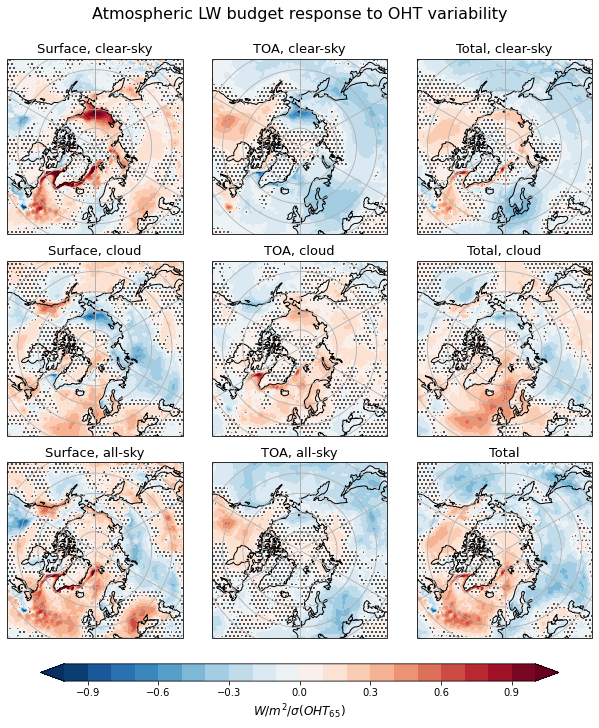

In [19]:
# plot the longwave regression maps

key = ["Surface, clear-sky", "TOA, clear-sky", "Total, clear-sky",
       "Surface, cloud",     "TOA, cloud",     "Total, cloud",
       "Surface, all-sky",   "TOA, all-sky",   "Total"]

# get lat lon grid
lat = getData("FLNT", atmdir, 1, getDataset=True).variables["lat"][128:]
lon = getData("FLNT", atmdir, 1, getDataset=True).variables["lon"]

fig, axs = plt.subplots(nrows=3,ncols=3,
                        subplot_kw={'projection': ccrs.NorthPolarStereo()},
                        figsize=(12,12))

axs=axs.flatten()

for i,k in enumerate(key):
    insignificant_mask = oht_LW_reg_new[i][:,:,0].copy()
    insignificant_mask[oht_LW_reg_new[i][:,:,1] < 0.05] = np.nan
    
    cs = axs[i].contourf(lon, lat, oht_LW_reg_new[i][:,:,0], np.arange(-1,1.1,0.1), 
                      cmap='RdBu_r', transform=ccrs.PlateCarree(), extend="both")
    axs[i].contourf(lon, lat, (insignificant_mask[:,:]), 
                    colors='none', hatches=["."*3], transform=ccrs.PlateCarree())
    axs[i].set_title(k, fontsize=13)
    axs[i].coastlines()
    axs[i].set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
    axs[i].gridlines()


fig.subplots_adjust(bottom=0.25, top=0.92, left=0.15, right=0.85,
                    wspace=0.05, hspace=0.15)

cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])
cbar=fig.colorbar(cs, cax=cbar_ax, orientation='horizontal')
cbar.set_label("$W/m^2/\sigma(OHT_{65})$", fontsize=12)

fig.suptitle('Atmospheric LW budget response to OHT variability', fontsize=16)

fig.savefig("figures/OHT_lw_regress.svg")

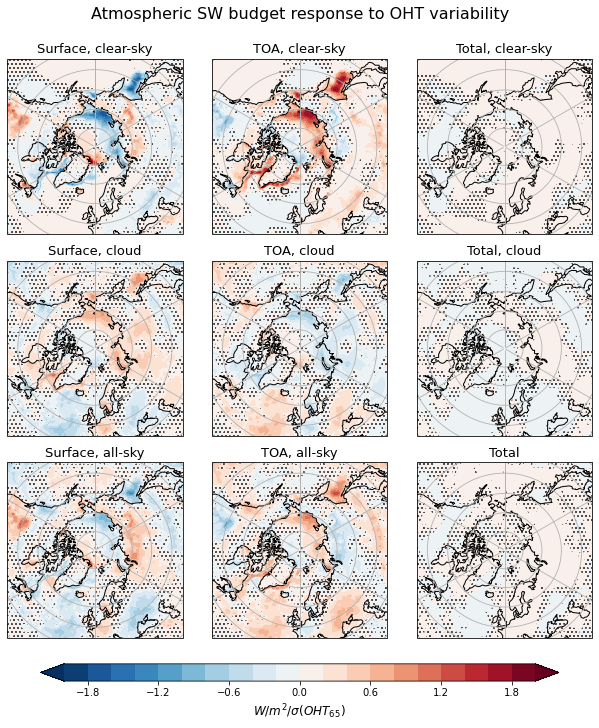

In [65]:
# plot the shortwave regression maps

key = ["Surface, clear-sky", "TOA, clear-sky", "Total, clear-sky",
       "Surface, cloud",     "TOA, cloud",     "Total, cloud",
       "Surface, all-sky",   "TOA, all-sky",   "Total"]
 
fig, axs = plt.subplots(nrows=3,ncols=3,
                        subplot_kw={'projection': ccrs.NorthPolarStereo()},
                        figsize=(12,12))

axs=axs.flatten()

for i,k in enumerate(key):
    insignificant_mask = oht_SW_reg_new[i][:,:,0].copy()
    insignificant_mask[oht_SW_reg_new[i][:,:,1] < 0.05] = np.nan
    
    cs = axs[i].contourf(lon, lat, oht_SW_reg_new[i][:,:,0], np.arange(-2,2.2,0.2), 
                      cmap='RdBu_r', transform=ccrs.PlateCarree(), extend="both")
    axs[i].contourf(lon, lat, (insignificant_mask[:,:]), 
                    colors='none', hatches=["."*3], transform=ccrs.PlateCarree())
    axs[i].set_title(k, fontsize=13)
    axs[i].coastlines()
    axs[i].set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
    axs[i].gridlines()


fig.subplots_adjust(bottom=0.25, top=0.92, left=0.15, right=0.85,
                    wspace=0.05, hspace=0.15)

cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])
cbar=fig.colorbar(cs, cax=cbar_ax, orientation='horizontal')
cbar.set_label("$W/m^2/\sigma(OHT_{65})$", fontsize=12)

fig.suptitle('Atmospheric SW budget response to OHT variability', fontsize=16)

fig.savefig("figures/OHT_sw_regress.svg")

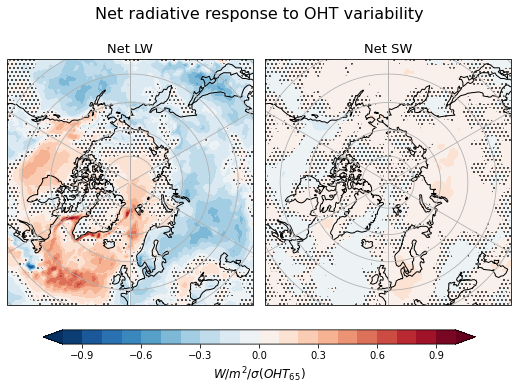

In [56]:
key = ["Net LW", "Net SW"]

oht_LW_reg = np.load("data/rflx/oht_LW_reg_full.npy")
oht_SW_reg = np.load("data/rflx/oht_SW_reg_full.npy")

data = [oht_LW_reg[8], oht_SW_reg[8]]

# longwave 
fig, axs = plt.subplots(nrows=1,ncols=2,
                        subplot_kw={'projection': ccrs.NorthPolarStereo()},
                        figsize=(10,6))

axs=axs.flatten()

for i,k in enumerate(key):
    insignificant_mask = data[i][:,:,0].copy()
    insignificant_mask[data[i][:,:,1] < 0.05] = np.nan
    
    cs = axs[i].contourf(lon, lat, data[i][:,:,0], np.arange(-1,1.1,0.1), 
                      cmap='RdBu_r', transform=ccrs.PlateCarree(), extend="both")
    axs[i].contourf(lon, lat, (insignificant_mask[:,:]), 
                    colors='none', hatches=["."*3], transform=ccrs.PlateCarree())
    axs[i].set_title(k, fontsize=13)
    axs[i].coastlines()
    axs[i].set_extent([-180, 180, 90, 45], ccrs.PlateCarree())
    axs[i].gridlines()


fig.subplots_adjust(bottom=0.25, top=0.9, left=0.15, right=0.85,
                    wspace=0.05, hspace=0.15)

cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.033])
cbar=fig.colorbar(cs, cax=cbar_ax, orientation='horizontal')
cbar.set_label("$W/m^2/\sigma(OHT_{65})$", fontsize=12)

fig.suptitle('Net radiative response to OHT variability', fontsize=16)

fig.savefig("figures/OHT_rflx_regress.svg")


## Integrated regression coefficients

In [35]:
# lat index 93 = 
print(lat[93].to_numpy())

65.390625


<BarContainer object of 3 artists>

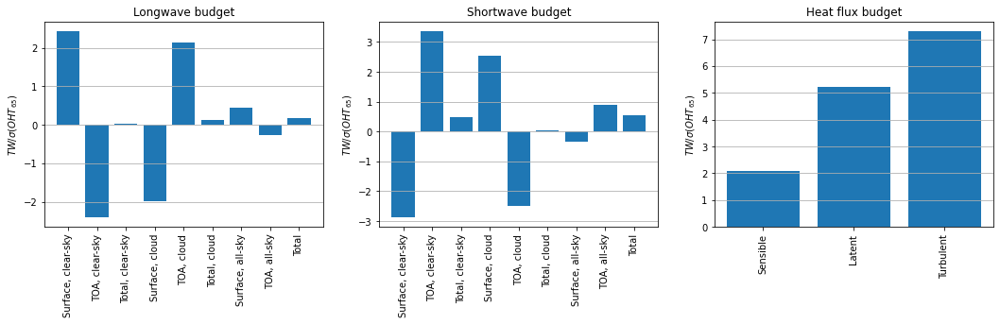

In [284]:
# integrated regression coefficients north of 65 N 

key = ["Surface, clear-sky", "TOA, clear-sky", "Total, clear-sky",
       "Surface, cloud",     "TOA, cloud",     "Total, cloud",
       "Surface, all-sky",   "TOA, all-sky",   "Total"]

key2 = ["Sensible", "Latent", "Turbulent"]

oht_LW_reg = np.load("data/rflx/oht_LW_reg_full.npy")
oht_SW_reg = np.load("data/rflx/oht_SW_reg_full.npy")
oht_hf_reg = np.load("data/oht_hflx_reg.npy")

# integrated fluxes in TW/sigma(OHT)
oht_LW_integrated = {}
oht_SW_integrated = {}
oht_hf_integrated = {}

area = np.load("data/area.npy")[128:,:]

for i,term in enumerate(oht_LW_reg):
    oht_LW_integrated[key[i]] = np.sum(term[93:,:,0] * area[93:,:] * a**2)/1e12

for i,term in enumerate(oht_SW_reg):
    oht_SW_integrated[key[i]] = np.sum(term[93:,:,0] * area[93:,:] * a**2)/1e12

for i,term in enumerate(oht_hf_reg):
    oht_hf_integrated[key2[i]] = np.sum(term[93:,:,0] * area[93:,:] * a**2)/1e12

figure(figsize=(18,4))

plt.subplot(1,3,1)
plt.xticks(rotation='vertical')
plt.grid(True, axis='y')
plt.title("Longwave budget")
plt.ylabel("$TW/\sigma(OHT_{65})$")
plt.bar(oht_LW_integrated.keys(), oht_LW_integrated.values())

plt.subplot(1,3,2)
plt.xticks(rotation='vertical')
plt.grid(True, axis='y')
plt.title("Shortwave budget")
plt.ylabel("$TW/\sigma(OHT_{65})$")
plt.bar(oht_SW_integrated.keys(), oht_SW_integrated.values())

plt.subplot(1,3,3)
plt.xticks(rotation='vertical')
plt.grid(True, axis='y')
plt.title("Heat flux budget")
plt.ylabel("$TW/\sigma(OHT_{65})$")
plt.bar(oht_hf_integrated.keys(), oht_hf_integrated.values())

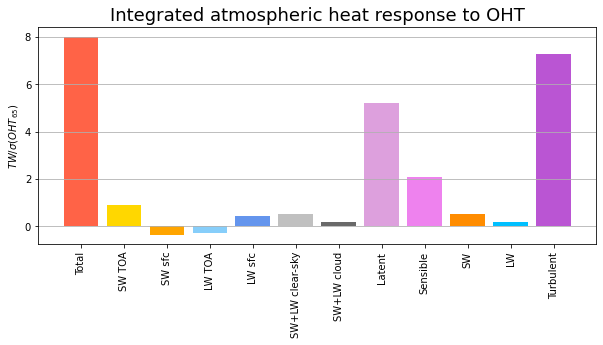

In [398]:
oht_all_int = {
    "Total": oht_hf_integrated["Turbulent"]+oht_LW_integrated["Total"]+oht_SW_integrated["Total"], 
    "SW TOA": oht_SW_integrated["TOA, all-sky"], 
    "SW sfc": oht_SW_integrated["Surface, all-sky"], 
    "LW TOA": oht_LW_integrated["TOA, all-sky"], 
    "LW sfc": oht_LW_integrated["Surface, all-sky"], 
    "SW+LW clear-sky": oht_SW_integrated["Total, clear-sky"] + oht_LW_integrated["Total, clear-sky"], 
    "SW+LW cloud": oht_SW_integrated["Total, cloud"] + oht_LW_integrated["Total, cloud"], 
    "Latent": oht_hf_integrated["Latent"], 
    "Sensible": oht_hf_integrated["Sensible"], 
    "SW": oht_SW_integrated["Total"], 
    "LW": oht_LW_integrated["Total"], 
    "Turbulent": oht_hf_integrated["Turbulent"]
}

colors = ['tomato','gold','orange','lightskyblue','cornflowerblue','silver','dimgrey','plum','violet',
          'darkorange', 'deepskyblue', 'mediumorchid']

figure(figsize=(10,4))
plt.xticks(rotation='vertical')
plt.grid(True, axis='y')
plt.title("Integrated atmospheric heat response to OHT", fontsize=18)
plt.ylabel("$TW/\sigma(OHT_{65})$")
plt.bar(oht_all_integrated.keys(), oht_all_int.values(), color=colors)

plt.savefig("figures/int_reg_components.svg", bbox_inches="tight")
#print(oht_all_int["Total"], oht_all_int["SW"] + oht_all_int["LW"] + oht_all_int["Turbulent"])
#print(oht_all_int["SW"], oht_all_int["SW TOA"] + oht_all_int["SW sfc"])
#print(oht_all_int["LW"], oht_all_int["LW TOA"] + oht_all_int["LW sfc"])
#print(oht_all_int["LW"]+oht_all_int["SW"], oht_all_int["SW+LW clear-sky"] + oht_all_int["SW+LW cloud"])


# Ocean heat storage
We see in the regression maps above that anomalies in the ocean heat transport are not readily communicated to the atmosphere via turbulent heat fluxes. Note that most of the signal aligns with the ice margin, but still the magnitude is quite small compared to other models (see Outten and Esau, 2017 for comparison). 

Below, I regress the OHT onto potential temperature at various depths to see where anomalous OHT manifests itself as anomalous change in ocean temperature. 

Some notes on potential temperature `TEMP`: 
- Coordinates: `(time, z_t, TLONG, TLAT)` 

600 970 62


Text(0, 0.5, 'depth (m)')

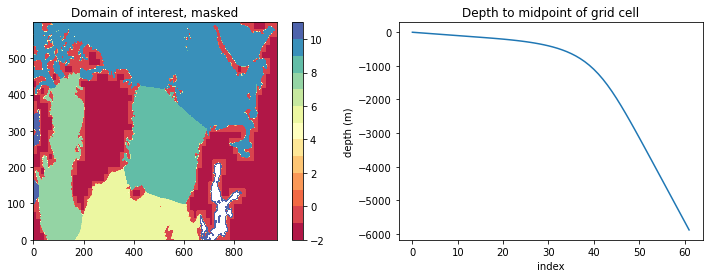

In [67]:
ref_file = "/global/cscratch1/sd/wilbert/iHESP/Ocean/TEMP/B.E.13.B1850C5.ne120_t12.sehires38.003.sunway_02.pop.h.TEMP.002101-002112.nc"

# get useful supporting data
region_mask = xr.open_dataset(ref_file).variables['REGION_MASK']
z = xr.open_dataset(ref_file).variables['z_t']

# indices of domain 
ilat = [1800, 2400]
ilon = [500, 1470]

nlat = ilat[1]-ilat[0]
nlon = ilon[1]-ilon[0]
nz = len(z)
print(nlat, nlon, nz)

# plot it 
figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.contourf(region_mask[ilat[0]:ilat[1],ilon[0]:ilon[1]], np.arange(-2, 12, 1), cmap='Spectral')
plt.title("Domain of interest, masked")
plt.colorbar()

plt.subplot(1,2,2)
plt.plot(-z/100)
plt.title("Depth to midpoint of grid cell")
plt.xlabel("index")
plt.ylabel("depth (m)")

In [40]:
# indices of domain 
ilat = [1800, 2400]
ilon = [500, 1470]

for yr in range(188, 520):
    print(f"getting SST for yr {yr}")
    temp = annmean(getOcnData("TEMP", "TEMP", [yr, yr+1], [0,1], ilat, ilon)[0])
    
    np.savez_compressed(f'data/thetao/sst_{yr}.npz', data=temp.data, mask=temp.mask)
    
    print("saved")



getting SST for yr 188
saved
getting SST for yr 189
saved
getting SST for yr 190
saved
getting SST for yr 191
saved
getting SST for yr 192
saved
getting SST for yr 193
saved
getting SST for yr 194
saved
getting SST for yr 195
saved
getting SST for yr 196
saved
getting SST for yr 197
saved
getting SST for yr 198
saved
getting SST for yr 199
saved
getting SST for yr 200
saved
getting SST for yr 201
saved
getting SST for yr 202
saved
getting SST for yr 203
saved
getting SST for yr 204
saved
getting SST for yr 205
saved
getting SST for yr 206
saved
getting SST for yr 207
saved
getting SST for yr 208
saved
getting SST for yr 209
saved
getting SST for yr 210
saved
getting SST for yr 211
saved
getting SST for yr 212
saved
getting SST for yr 213
saved
getting SST for yr 214
saved
getting SST for yr 215
saved
getting SST for yr 216
saved
getting SST for yr 217
saved
getting SST for yr 218
saved
getting SST for yr 219
saved
getting SST for yr 220
saved
getting SST for yr 221
saved
getting SST fo

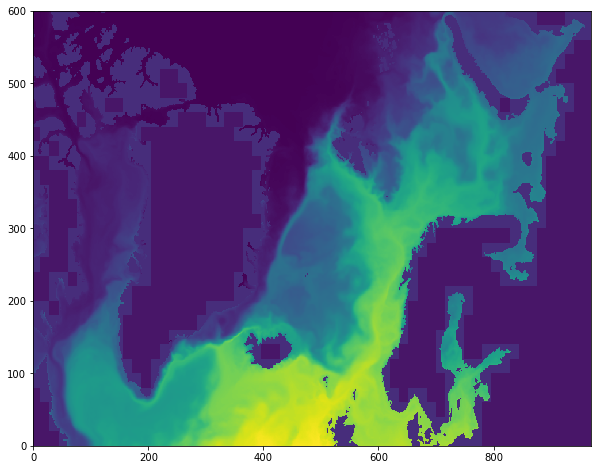

In [55]:
nlat = ilat[1] - ilat[0]
nlon = ilon[1] - ilon[0]

sst_ann = np.empty((350, nlat, nlon))
for yr in range(170, 520):
    with np.load(f'data/thetao/sst_{yr}.npz') as npz:
        sst_ann[yr-170,:,:] = np.ma.MaskedArray(**npz).data.squeeze()

figure(figsize=(10,8))
plt.pcolormesh(sst_ann[0,:,:])



In [56]:
sst_filt = signal.detrend(running_mean(sst_ann, 10), axis=0)

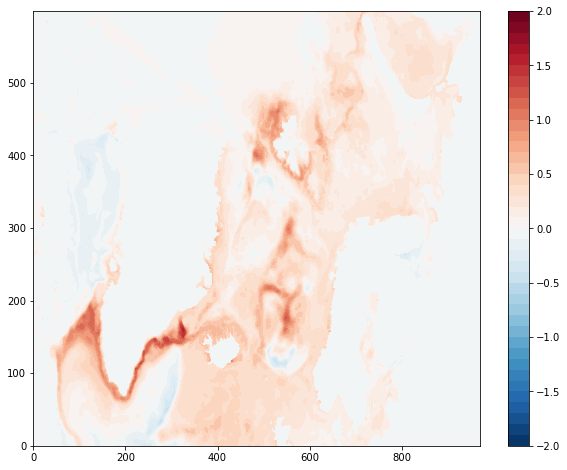

In [66]:
figure(figsize=(10,8))
plt.contourf(sst_filt[179,:,:], np.arange(-2, 2.1, 0.1), cmap='RdBu_r')
plt.colorbar()

In [81]:
oht_comp = {
    "Global": xr.open_dataset(ocndir + "vTFlux_65N_Global.nc").variables['vTFlux_65N_Global'][169:],
    "GSR": xr.open_dataset(ocndir + "vTFlux_65N_GSR.nc").variables['vTFlux_65N_GSR'][169:],
    "Bering": xr.open_dataset(ocndir + "vTFlux_65N_Bering.nc").variables['vTFlux_65N_Bering'][169:],
    "Davis": xr.open_dataset(ocndir + "vTFlux_65N_Davis.nc").variables['vTFlux_65N_Davis'][169:]
}

oht_comp["Residual"] = oht_comp["Global"]-oht_comp["GSR"]-oht_comp["Bering"]-oht_comp["Davis"]

oht_filt = {}

oht_filt["Pacific"] = signal.detrend(running_mean(oht_comp["Bering"], 10))
oht_filt["Atlantic"] = signal.detrend(running_mean(oht_comp["Global"] - oht_comp["Bering"], 10))
oht_filt["Total"] = signal.detrend(running_mean(oht_comp["Global"], 10))

# normalize the oht timeseries by dividing by the stdev
oht_norm = {}

for term in oht_filt.keys():
    oht_norm[term] = oht_filt[term] / oht_filt[term].std()

sst_oht_reg = regress_spatial(sst_filt, oht_norm["Atlantic"])

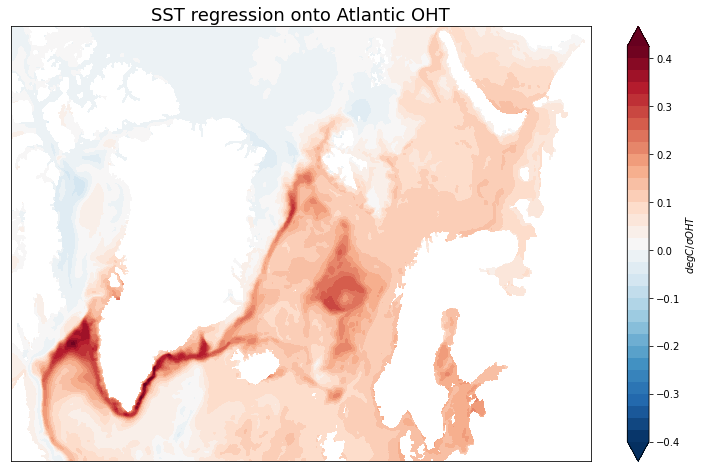

In [157]:
# make SST regression map
tlat = xr.open_dataset(ref_file).variables['TLAT'][ilat[0]:ilat[1], ilon[0]:ilon[1]]
tlon = xr.open_dataset(ref_file).variables['TLONG'][ilat[0]:ilat[1], ilon[0]:ilon[1]]

#fig, axs = plt.subplots(nrows=1,ncols=1,
#                            subplot_kw={'projection': ccrs.NorthPolarStereo()},
#                            figsize=(11, 8))

#cs = axs.contourf(sst_oht_reg[:,:,0], transform=ccrs.PlateCarree(), extend="both")
#fig.colorbar()



with np.load(f'data/thetao/sst_170.npz') as npz:
    sst_mask = np.ma.MaskedArray(**npz).mask.squeeze()
        

sst_nan = (sst_ann[0,:,:] == -1.0)

figure(figsize=(13,8))
plt.contourf(np.ma.masked_array(sst_oht_reg[:,:,0], np.logical_or(sst_mask,sst_nan)), np.arange(-0.4, 0.45, 0.025), extend='both', cmap='RdBu_r')
plt.title("SST regression onto Atlantic OHT", fontsize=18)
plt.colorbar(label = '$deg C/\sigma OHT$')
plt.xticks([])
plt.yticks([])

plt.savefig('figures/SST_Atl_reg.svg')